### This notebook produces the final result for round 2. It (1) removes explanations from covid_seq2seq_round2 notebook, (2)merge multiple cells(steps) into one function for convenience, (3) run under 28 parameter settings and take the average.

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
import tensorflow as tf
import datetime
from math import sqrt
from sklearn.metrics import mean_squared_error
from numpy import array
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.layers import Bidirectional
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras import optimizers 
from keras.layers import Input
from keras import layers
from keras.models import Model
from sklearn.preprocessing import MinMaxScaler

Using TensorFlow backend.


In [3]:
import sys 
import seq2seq_attention as s2s_a

In [4]:
def impute_first_nan(data):
    for i in range(len(data.columns)):
        if data.columns[i] == 'Province_State':
            continue
        else:
            if np.isnan(data.iloc[0,i]):
                data.iloc[0,i] = 0

def impute_missing_vals(data):
    impute_first_nan(data)
    for col in data.columns:
        if col == 'Province_State':
            continue
        else:
            if sum(np.isnan(data[col])) != 0:
                data[col] = data[col].interpolate(method='linear')
    return data

def split_train_test(data, begin_date, end_date):
    train = data.loc[(data.index <= datetime.datetime.strptime(end_date,'%Y-%m-%d')) &
                     (data.index > datetime.datetime.strptime(begin_date,'%Y-%m-%d')), ]
    test = data.loc[(data.index <= datetime.datetime.strptime(end_date,'%Y-%m-%d')) &
                    (data.index > datetime.datetime.strptime(begin_date,'%Y-%m-%d')), ]
# divide data into 7-day bucket
    train = np.array(np.split(train.values, len(train.values)/7))
    test = np.array(np.split(test.values, len(test.values)/7))
    return train, test

def pairing(train, n_input, n_out):
    # revert from 7-days buckets back to flatten array
    data = train.reshape((train.shape[0]*train.shape[1], train.shape[2]))
    X, y1, y2 = [], [], []
    # i_1 is start of input, i_2 is end of input
    # o_1 is start of output, o_2 is end of output
    for i_1 in range(len(data)):
        i_2 = i_1 + n_input
        o_1 = i_2
        o_2 = o_1 + n_out
        # prevent the moving window from exceeding the end of length
        if o_2 <= len(data):
            X.append(data[i_1:i_2, :])
            y1.append(data[o_1:o_2, 0])
            y2.append(data[o_1:o_2, 1])
    return np.array(X), np.array(y1), np.array(y2)

In [5]:
def round2_go(begin_date, end_date, n_input, n_out, w):
    df = pd.DataFrame()
    df_final = pd.DataFrame()
    df_later = pd.DataFrame()
    df_impute = pd.DataFrame()
    
    df = pd.read_csv("train_round2.csv")
    df['Date'] = pd.to_datetime(df['Date'])
    df.index = df['Date']
    df_list = []
    states_list = np.unique(df['Province_State'])
    for i in range(13):
        date_i = datetime.datetime.strptime('11-23-2020','%m-%d-%Y') + datetime.timedelta(days=i)
        date_i_str = datetime.datetime.strftime(date_i, "%m-%d-%Y")
        file_str = "csse_covid_19_daily_reports_us/" + date_i_str + ".csv"
        df_temp = pd.read_csv(file_str)
        df_temp['Date'] = date_i
        df_temp = df_temp.loc[df_temp['Province_State'].isin(states_list),]
        df_list.append(df_temp)

    for i in range(len(df_list)):
        #df_list[i]['Date'] = pd.to_datetime(df_list[i]['Last_Update'].str[:10])
        df_list[i]['Date'] = pd.to_datetime(df_list[i]['Date'])
        df_list[i].index = df_list[i]['Date']
        df_list[i] = df_list[i][['Province_State','Confirmed', 'Deaths']]

    df_later = pd.concat(df_list)
    df_final = pd.concat([df[['Province_State','Confirmed', 'Deaths']], df_later])
    
    df = df_final.copy()
    df_1 = df.loc[(df.index <= datetime.datetime.strptime(end_date,'%Y-%m-%d')) &
                    (df.index >= datetime.datetime.strptime(begin_date,'%Y-%m-%d')), ]

    df_impute = pd.DataFrame()
    for p in np.unique(df_1['Province_State']):
        if len(df_impute) == 0:
            df_impute = impute_missing_vals(df_1[df_1['Province_State'] == p])
        else:
            df_impute = df_impute.append(impute_missing_vals(df_1[df_1['Province_State'] == p]))

    df_1b = df_impute.copy()
    df_1b = df_1b.drop([datetime.datetime.strptime(begin_date,'%Y-%m-%d')])
    for p in np.unique(df_1['Province_State']):
        for col in ['Confirmed', 'Deaths']:
            df_1b.loc[df_1b['Province_State'] == p, col] = np.diff(df_impute.loc[df_impute['Province_State'] == p, col])

    for p in np.unique(df_1['Province_State']):
        for col in ['Confirmed', 'Deaths']:
            df_temp = df_1b.loc[df_1b['Province_State'] == p]
            val = df_temp.loc[:, col].rolling(window=w, min_periods = 1, center=True).mean().values
            df_1b.loc[df_1b['Province_State'] == p, col] = val

    scaler_1_each = []
    scaler_2_each = []
    for i in range(1, len(df_1b.columns)):
        for p in np.unique(df_1['Province_State']):
            col = df_1b.columns[i]
            val = df_1b.loc[(df_1b['Province_State'] == p) &
                            (df_1b.index <= datetime.datetime.strptime(end_date,'%Y-%m-%d')) &
                            (df_1b.index > datetime.datetime.strptime(begin_date,'%Y-%m-%d')), col].values.reshape(-1, 1)
            scaler = MinMaxScaler(feature_range=(0, 1))
            scaler = scaler.fit(val)
            scaled = scaler.transform(val)
            df_1b.loc[(df_1b['Province_State'] == p) &
                            (df_1b.index <= datetime.datetime.strptime(end_date,'%Y-%m-%d')) &
                            (df_1b.index > datetime.datetime.strptime(begin_date,'%Y-%m-%d')), col] = scaled
            if i == 1:
                scaler_1_each.append(scaler)
            elif i == 2:
                scaler_2_each.append(scaler)

    train_ls = []
    test_ls = []
    for p in np.unique(df_1b['Province_State']):
        df_temp = df_1b[df_1b['Province_State'] == p].iloc[:,1:]
        train_, test_ = split_train_test(df_temp, begin_date, end_date)
        train_ls.append(train_)
        test_ls.append(test_)

    demo_ls = []
    for i in range(50):
        demo_temp = np.zeros(50)
        demo_temp[i] = 1
        demo_ls.append(demo_temp)


    X_train = np.array([])
    Y_train_1 = np.array([])
    Y_train_2 = np.array([])
    X_train_demo = np.array([])
    for i in range(len(train_ls)):
        train_ = train_ls[i]
        test_ = test_ls[i]
        train_x, train_y_1, train_y_2 = pairing(train_, n_input, n_out)
        if len(X_train) == 0:
            X_train = train_x
            Y_train_1 = train_y_1
            Y_train_2 = train_y_2
            demo = np.zeros(train_x.shape[0]*50).reshape(-1,50)
            demo[:, i] = 1
            X_train_demo = demo
        else:
            X_train = np.vstack([X_train, train_x])
            Y_train_1 = np.vstack([Y_train_1, train_y_1])
            Y_train_2 = np.vstack([Y_train_2, train_y_2])
            demo = np.zeros(train_x.shape[0]*50).reshape(-1,50)
            demo[:, i] = 1
            X_train_demo = np.vstack([X_train_demo, demo])

    X_train_demo = X_train_demo.reshape((X_train.shape[0],1,50))
    X_train_demo = np.repeat(X_train_demo,n_out,axis=1)
    
    matplotlib.rcParams['figure.figsize'] = (8.0, 6.0)
    test = 0 # test is useless for this version where we only do validation
    pred1, pred2, lstm_1 = s2s_a.run_model(X_train, X_train_demo, Y_train_1, Y_train_2,  test, train_ls, 
                                         demo_ls, n_input, n_out, epochs = 150, batch_size = 32)
    
    matplotlib.rcParams['figure.figsize'] = (20.0, 30.0)
    fig, ax = plt.subplots(25, 2)
    pp1 = []
    for i in range(len(pred1)):
        p = np.unique(df_1['Province_State'])[i]
        start_val = df.loc[df.index == datetime.datetime.strptime('2020-12-05','%Y-%m-%d'), ].values[i][1]
        pred_list = np.array(pred1[i]).flatten()
        pred_list = scaler_1_each[i].inverse_transform(pred_list.reshape(-1, 1)).flatten().tolist()
        pred_list = [start_val] + pred_list
        pred_sum = np.cumsum(pred_list)[1:] #[12-06, .. ]
        
        actual_before = df_1[df_1['Province_State']==p]['Confirmed'].values[-30:]
        days_before = len(actual_before)
        ax[int(i/2)][i%2].plot(np.arange(0,days_before), actual_before, color= 'blue')
        ax[int(i/2)][i%2].plot(np.arange(days_before,days_before+8), pred_sum[:8], color= 'orange')
        
        pp1.append(pred_sum.tolist()[1:8])
        
    plt.show()
    
    fig, ax = plt.subplots(25, 2)
    pp2 = []
    for i in range(len(pred1)):
        p = np.unique(df_1['Province_State'])[i]
        start_val = df.loc[df.index == datetime.datetime.strptime('2020-12-05','%Y-%m-%d'), ].values[i][2]
        pred_list = np.array(pred2[i]).flatten()
        pred_list = scaler_2_each[i].inverse_transform(pred_list.reshape(-1, 1)).flatten().tolist()
        pred_list = [start_val] + pred_list
        pred_sum = np.cumsum(pred_list)[1:] #[2:9]
        
        actual_before = df_1[df_1['Province_State']==p]['Deaths'].values[-30:]
        days_before = len(actual_before)
        ax[int(i/2)][i%2].plot(np.arange(0,days_before), actual_before, color= 'blue')
        ax[int(i/2)][i%2].plot(np.arange(days_before,days_before+8), pred_sum[:8], color= 'orange')
        
        pp2.append(pred_sum.tolist()[1:8])
        
    plt.show()
        
    return (pp1, pp2)

In [28]:
params_set_56 = [('2020-10-03', '2020-12-05', 56, 7, 2), ('2020-09-26', '2020-12-05', 56, 7, 2),
                 ('2020-08-29', '2020-12-05', 56, 7, 2), ('2020-08-01', '2020-12-05', 56, 7, 2), 
                 ('2020-07-04', '2020-12-05', 56, 7, 2), ('2020-06-06', '2020-12-05', 56, 7, 2), 
                 #--sm4
                 ('2020-10-03', '2020-12-05', 56, 7, 4), ('2020-09-26', '2020-12-05', 56, 7, 4),
                 ('2020-08-29', '2020-12-05', 56, 7, 4), ('2020-08-01', '2020-12-05', 56, 7, 4), 
                 ('2020-07-04', '2020-12-05', 56, 7, 4), ('2020-06-06', '2020-12-05', 56, 7, 4)]

In [7]:
params_set_28 = [('2020-10-03', '2020-12-05', 28, 7, 2), ('2020-09-26', '2020-12-05', 28, 7, 2),
                 ('2020-08-29', '2020-12-05', 28, 7, 2), ('2020-08-01', '2020-12-05', 28, 7, 2), 
                 #--sm4
                 ('2020-10-03', '2020-12-05', 28, 7, 4), ('2020-09-26', '2020-12-05', 28, 7, 4),
                 ('2020-08-29', '2020-12-05', 28, 7, 4), ('2020-08-01', '2020-12-05', 28, 7, 4)]

In [8]:
params_set_14 = [('2020-10-03', '2020-12-05', 14, 7, 2), ('2020-09-26', '2020-12-05', 14, 7, 2),
                 ('2020-08-29', '2020-12-05', 14, 7, 2), ('2020-08-01', '2020-12-05', 14, 7, 2), 
                 #--sm4
                 ('2020-10-03', '2020-12-05', 14, 7, 4), ('2020-09-26', '2020-12-05', 14, 7, 4),
                 ('2020-08-29', '2020-12-05', 14, 7, 4), ('2020-08-01', '2020-12-05', 14, 7, 4)]

(50, 56, 2)
(50, 7, 50)
(50, 7, 1)
(50, 7, 1)
check
Epoch 00026: early stopping


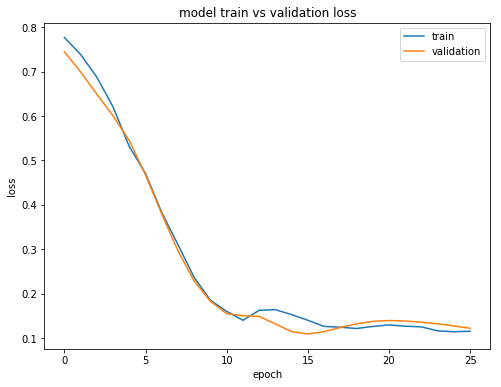

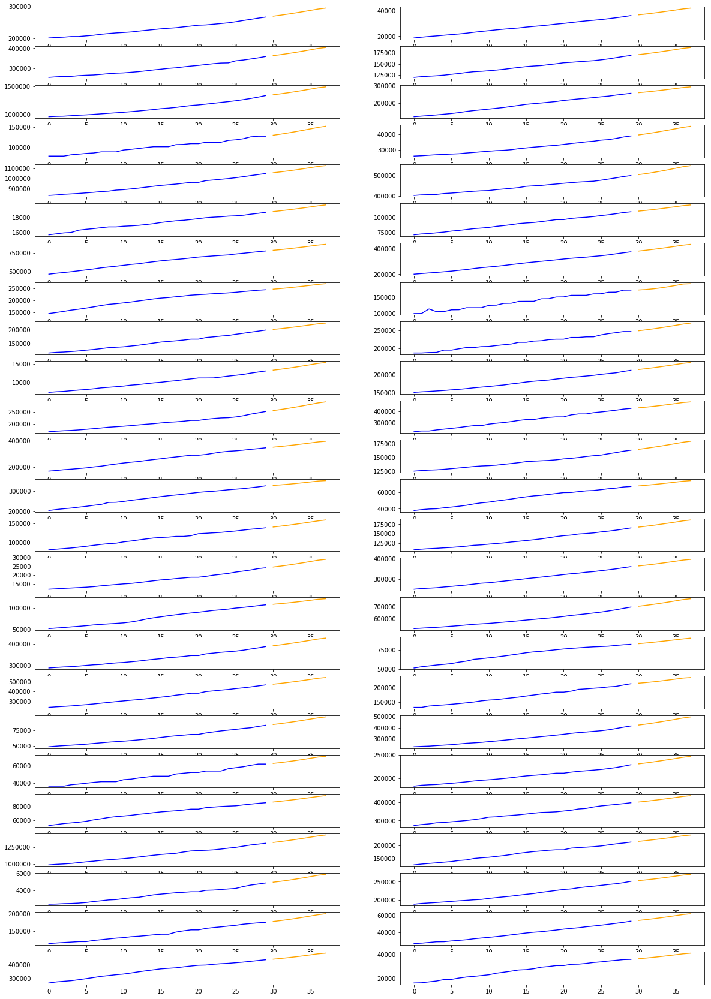

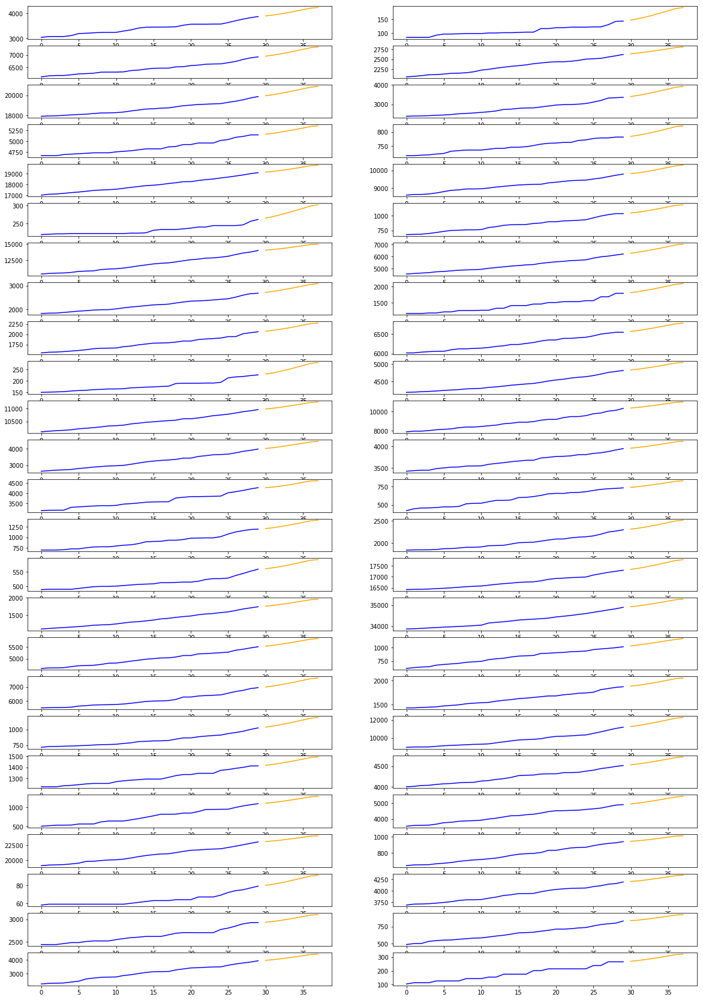

(400, 56, 2)
(400, 7, 50)
(400, 7, 1)
(400, 7, 1)
check
Epoch 00029: early stopping


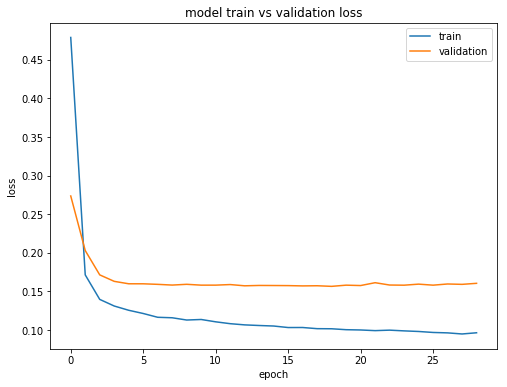

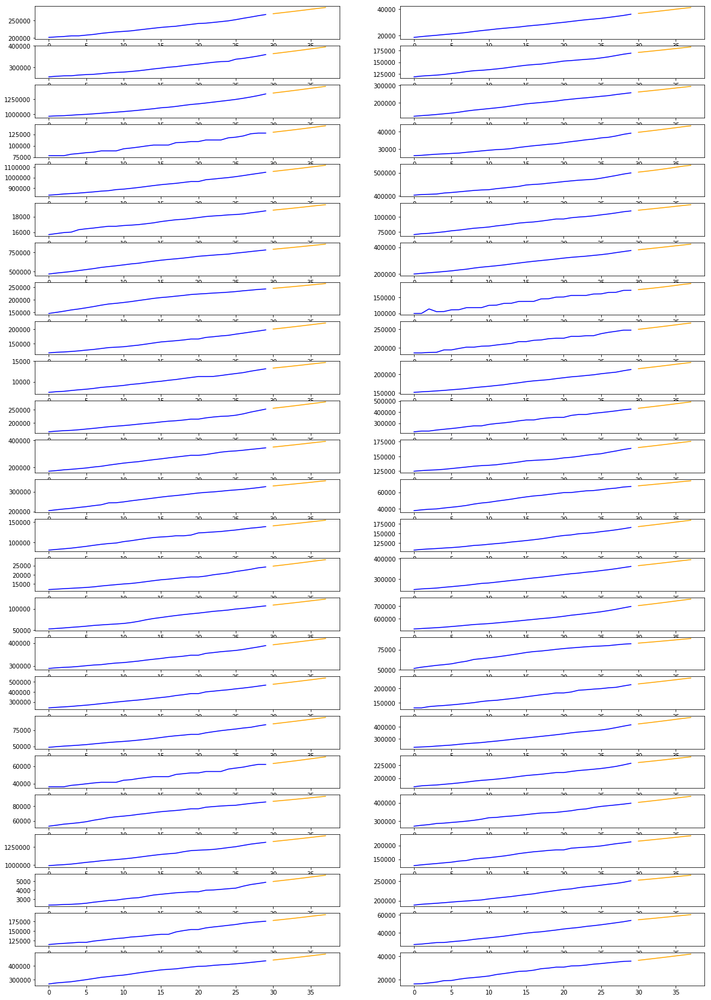

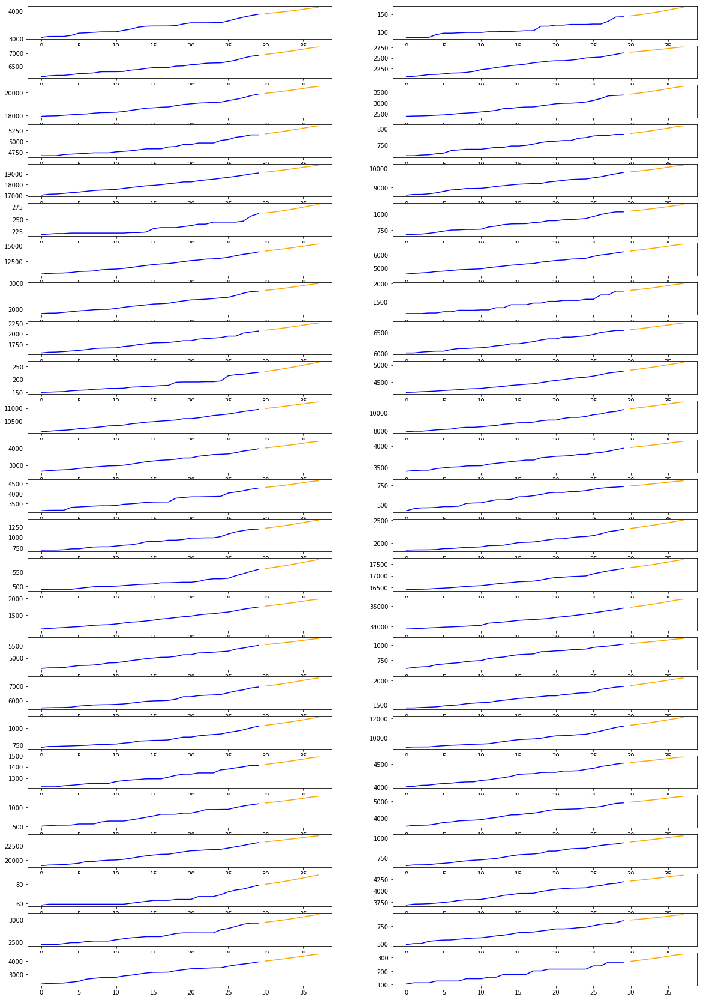

(1800, 56, 2)
(1800, 7, 50)
(1800, 7, 1)
(1800, 7, 1)
check
Epoch 00097: early stopping


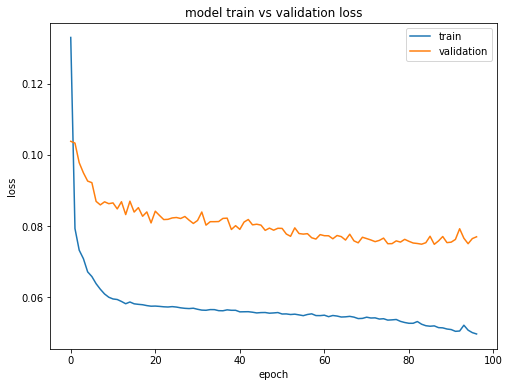

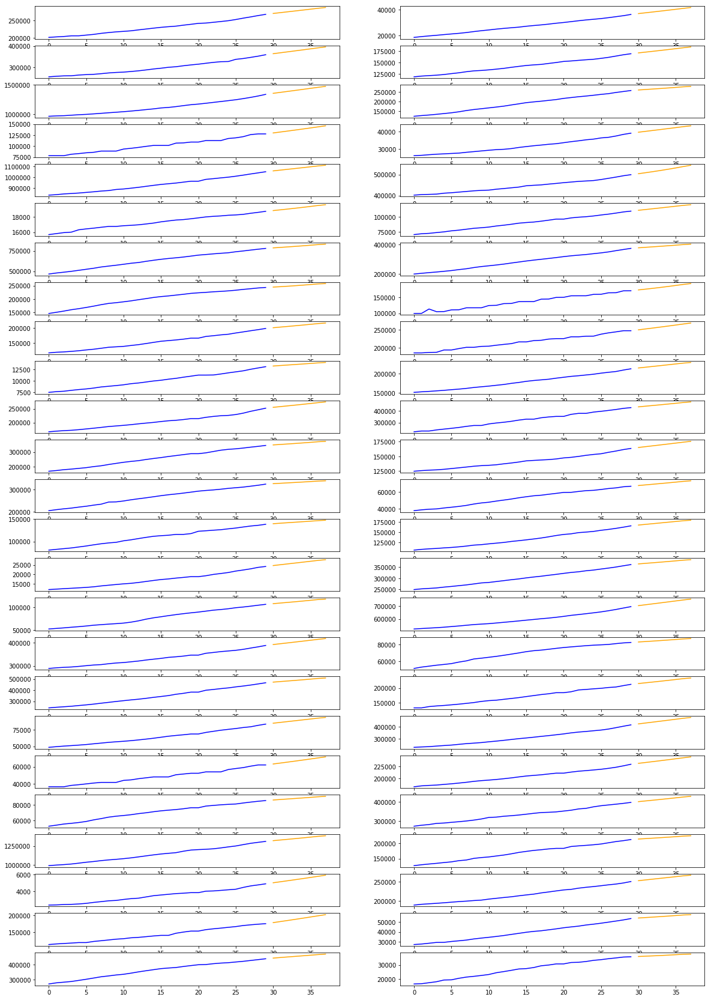

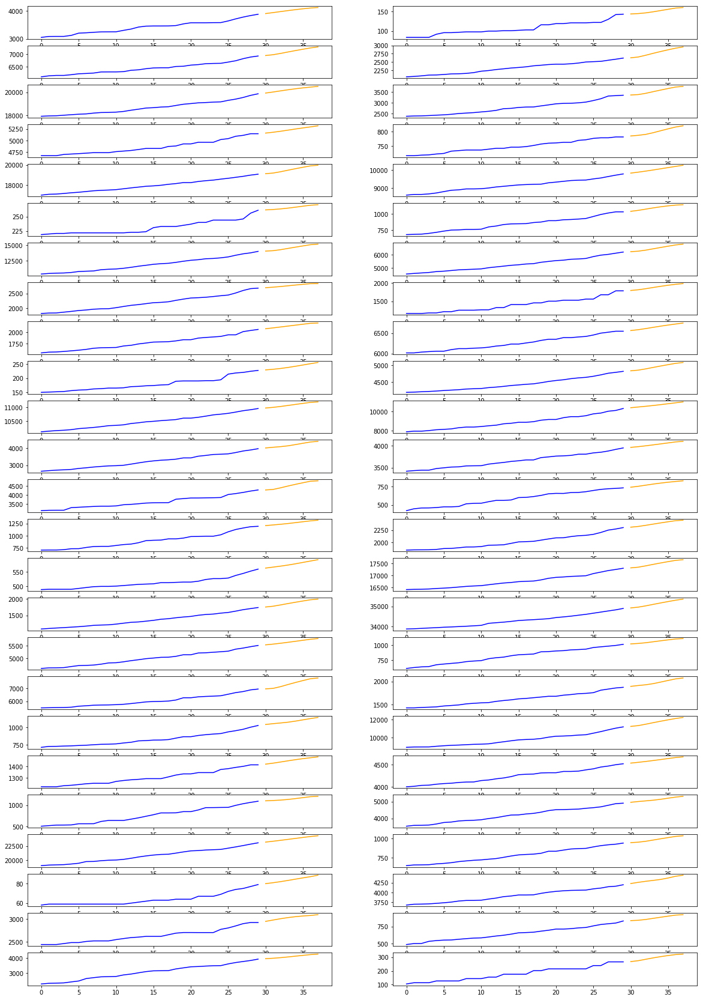

(3200, 56, 2)
(3200, 7, 50)
(3200, 7, 1)
(3200, 7, 1)
check
Epoch 00021: early stopping


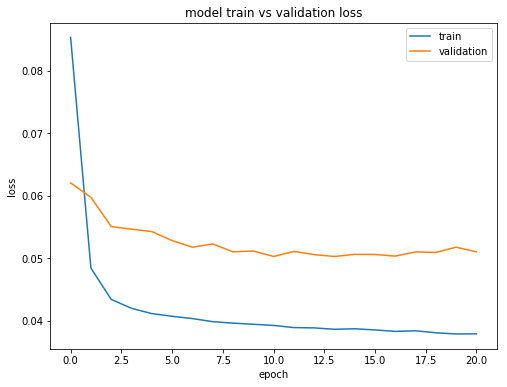

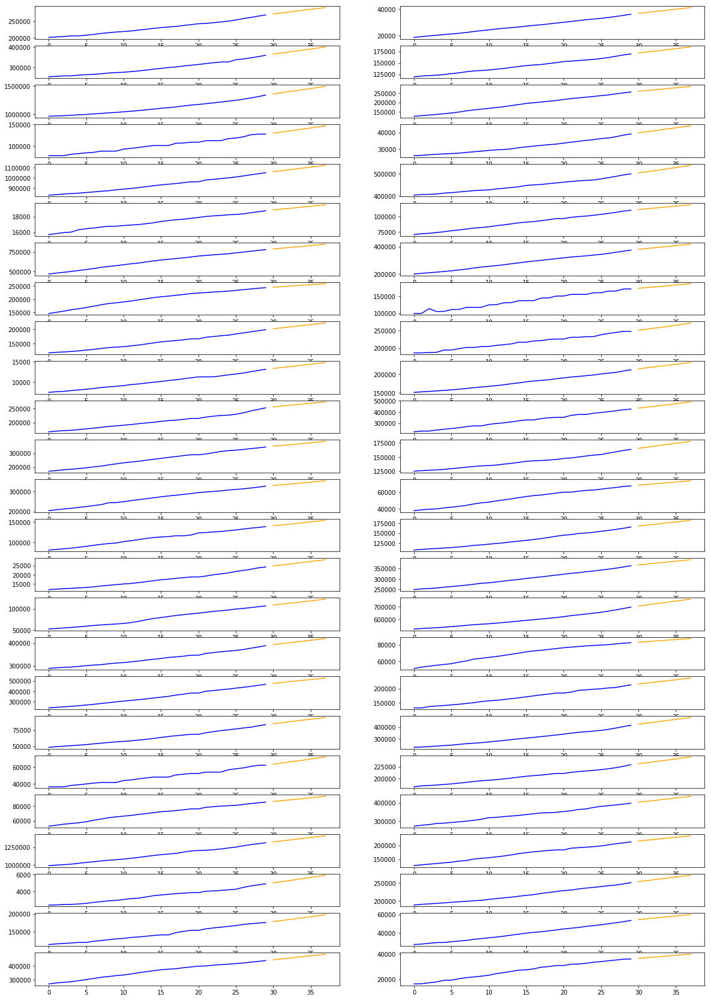

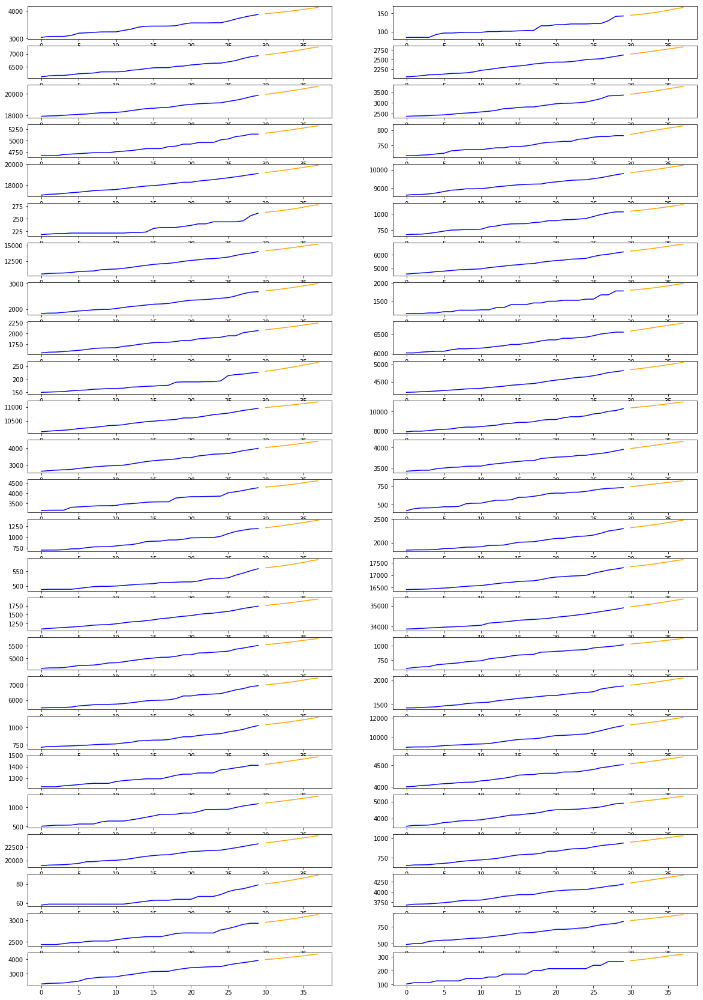

(4600, 56, 2)
(4600, 7, 50)
(4600, 7, 1)
(4600, 7, 1)
check
Epoch 00019: early stopping


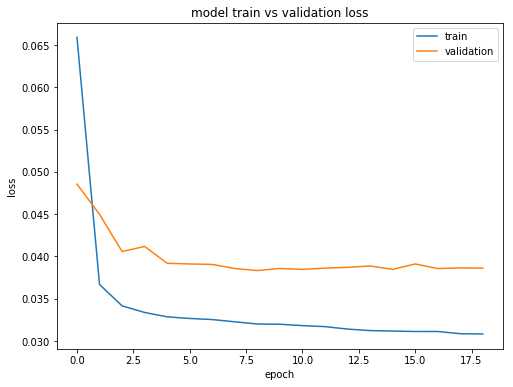

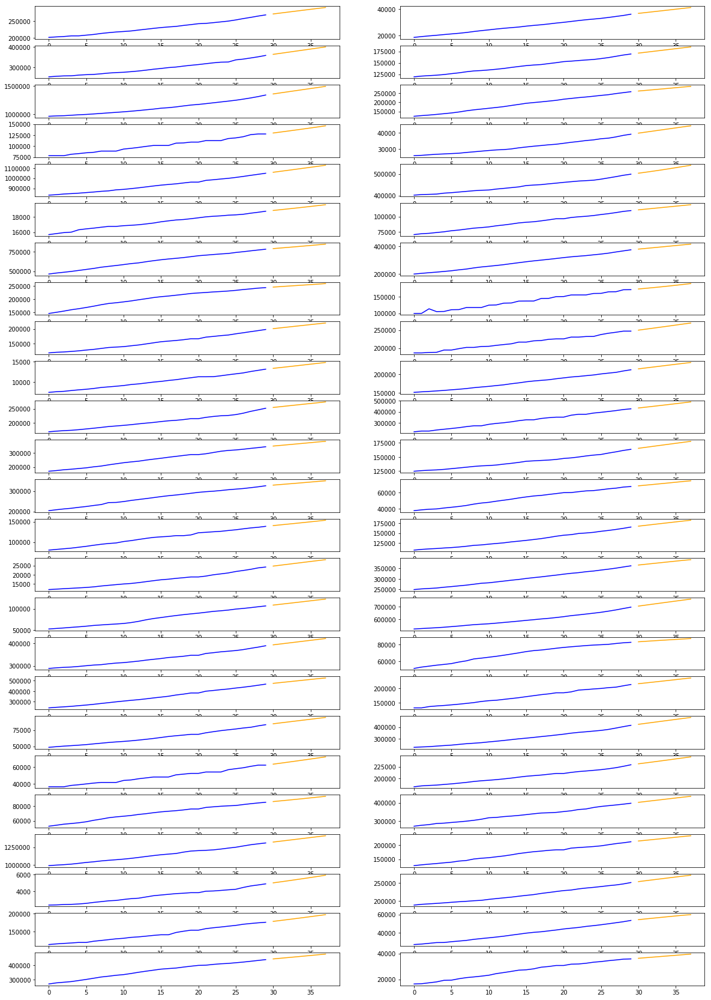

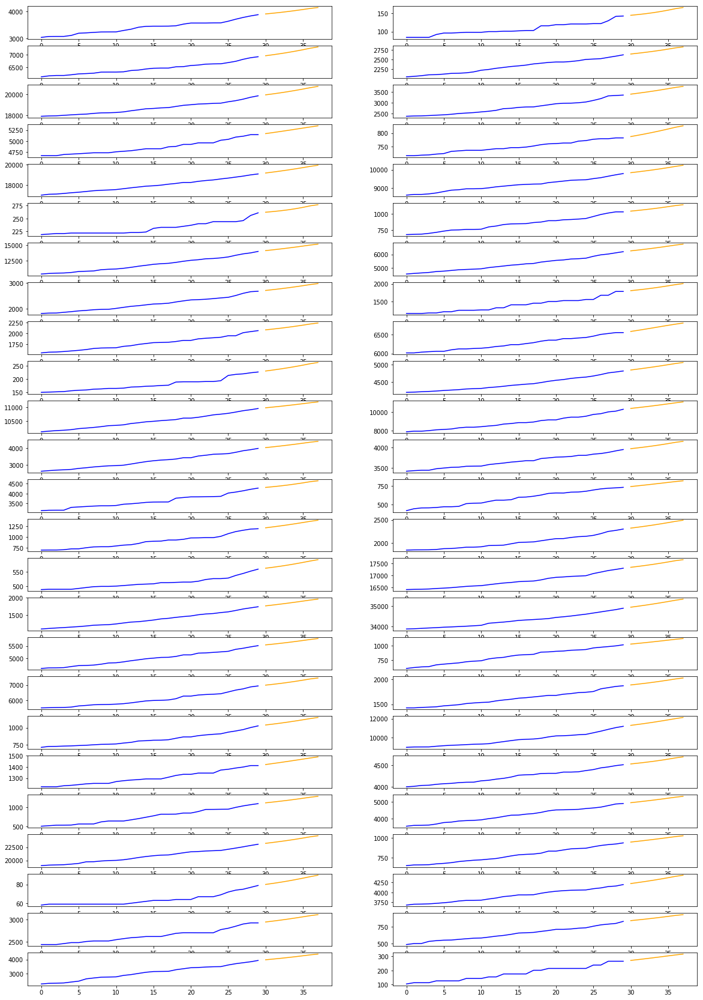

(6000, 56, 2)
(6000, 7, 50)
(6000, 7, 1)
(6000, 7, 1)
check
Epoch 00034: early stopping


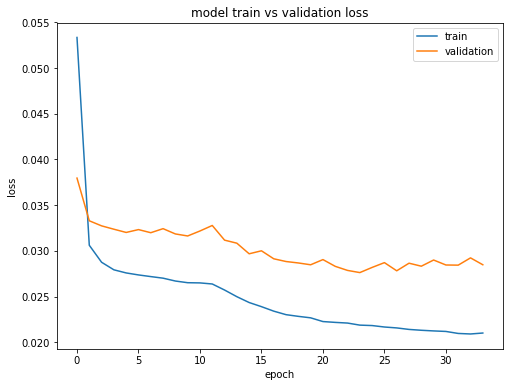

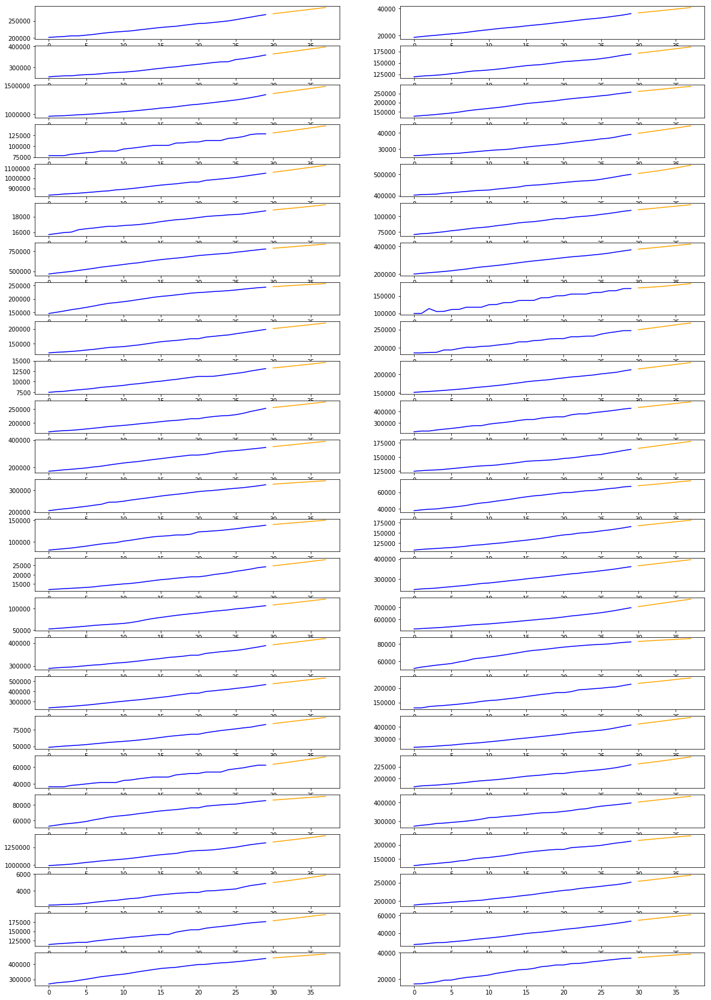

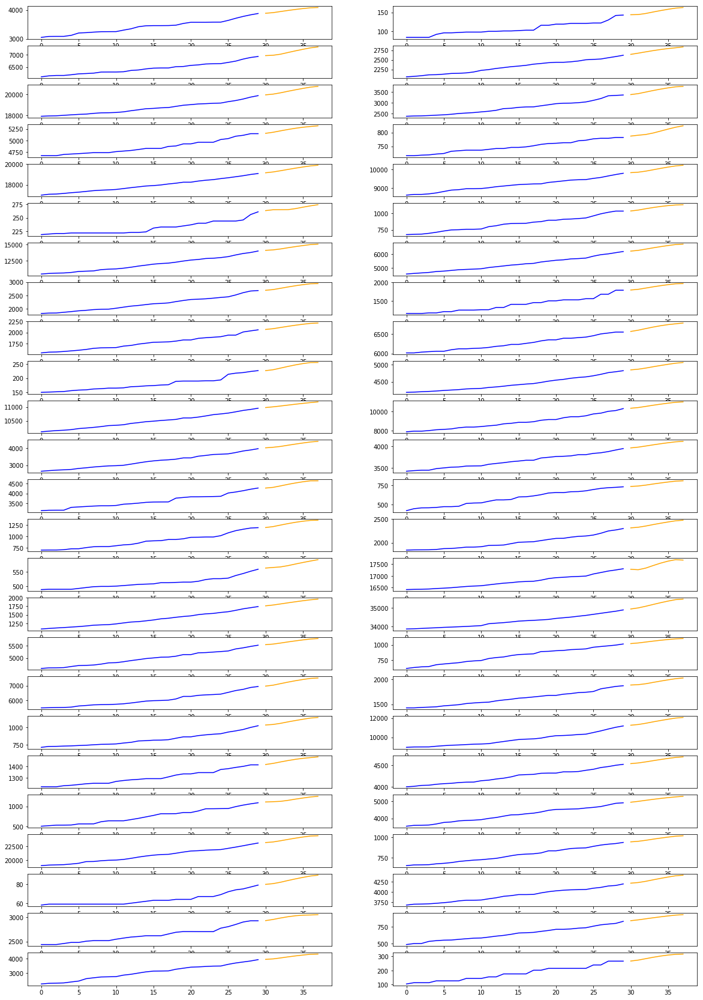

(50, 56, 2)
(50, 7, 50)
(50, 7, 1)
(50, 7, 1)
check
Epoch 00072: early stopping


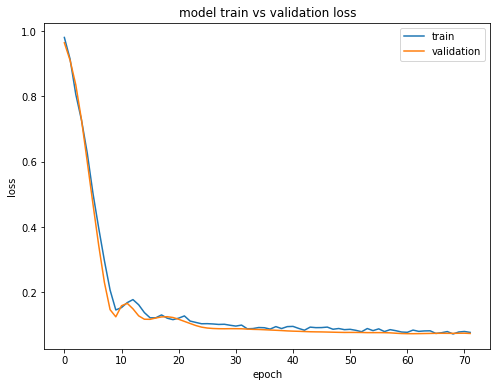

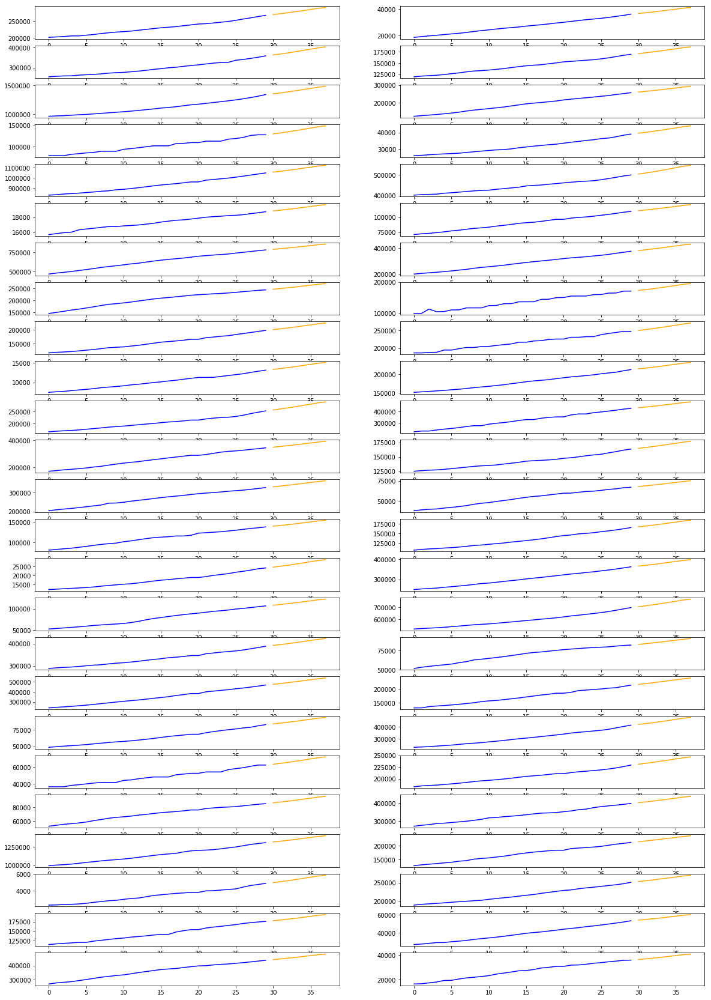

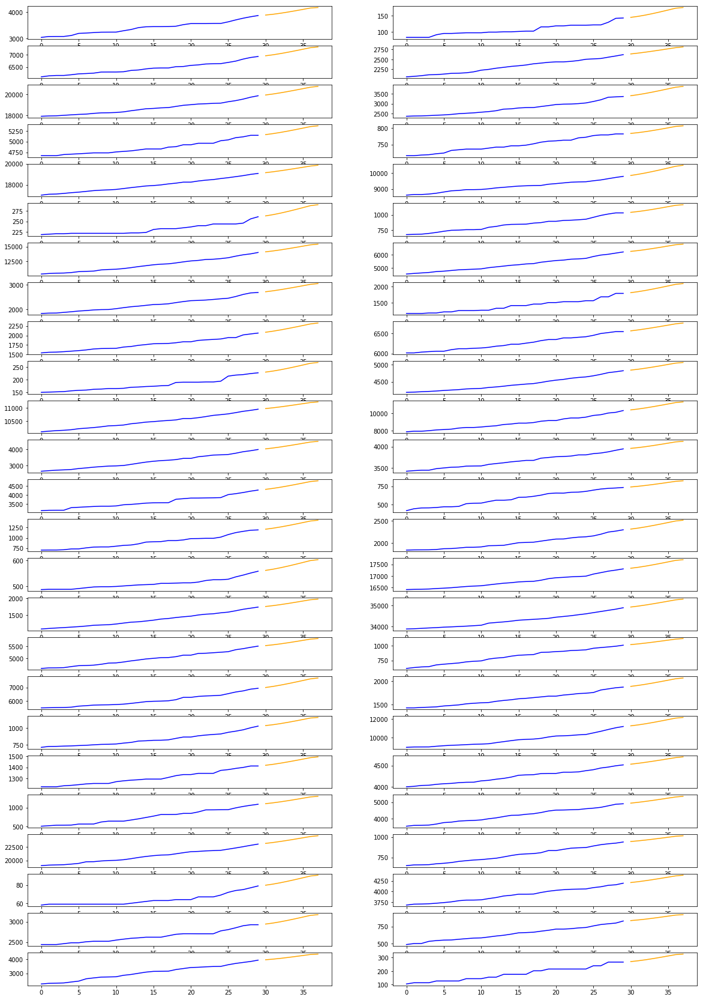

(400, 56, 2)
(400, 7, 50)
(400, 7, 1)
(400, 7, 1)
check
Epoch 00036: early stopping


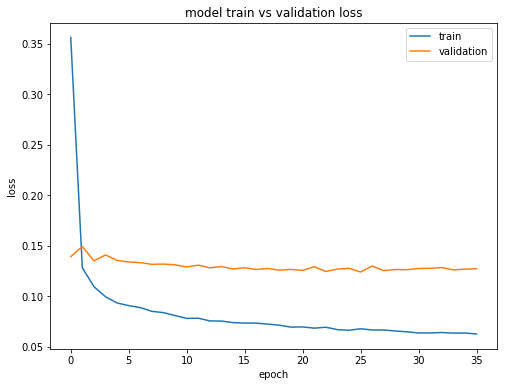

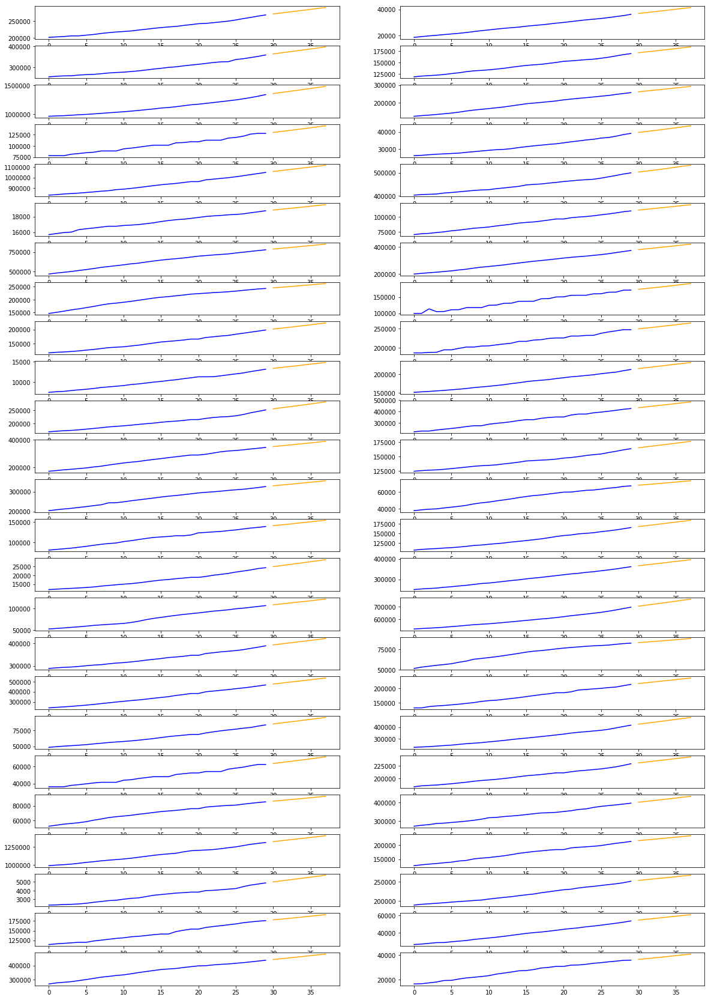

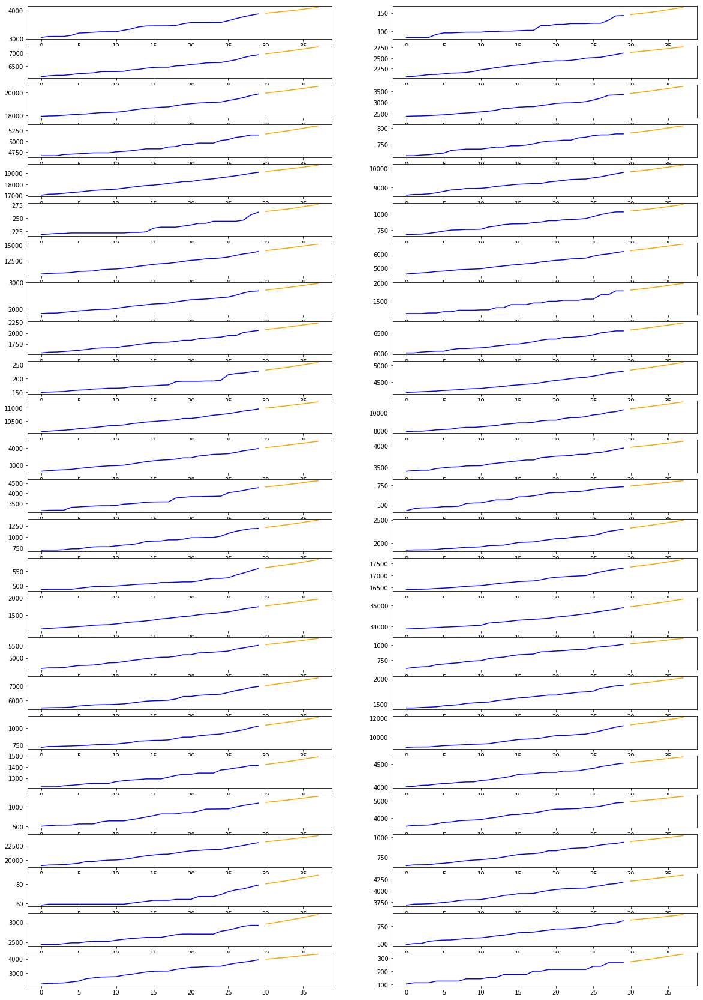

(1800, 56, 2)
(1800, 7, 50)
(1800, 7, 1)
(1800, 7, 1)
check
Epoch 00037: early stopping


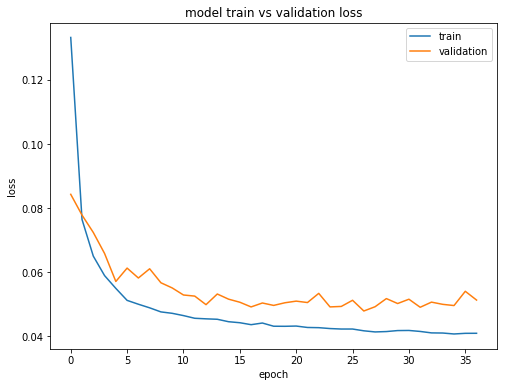

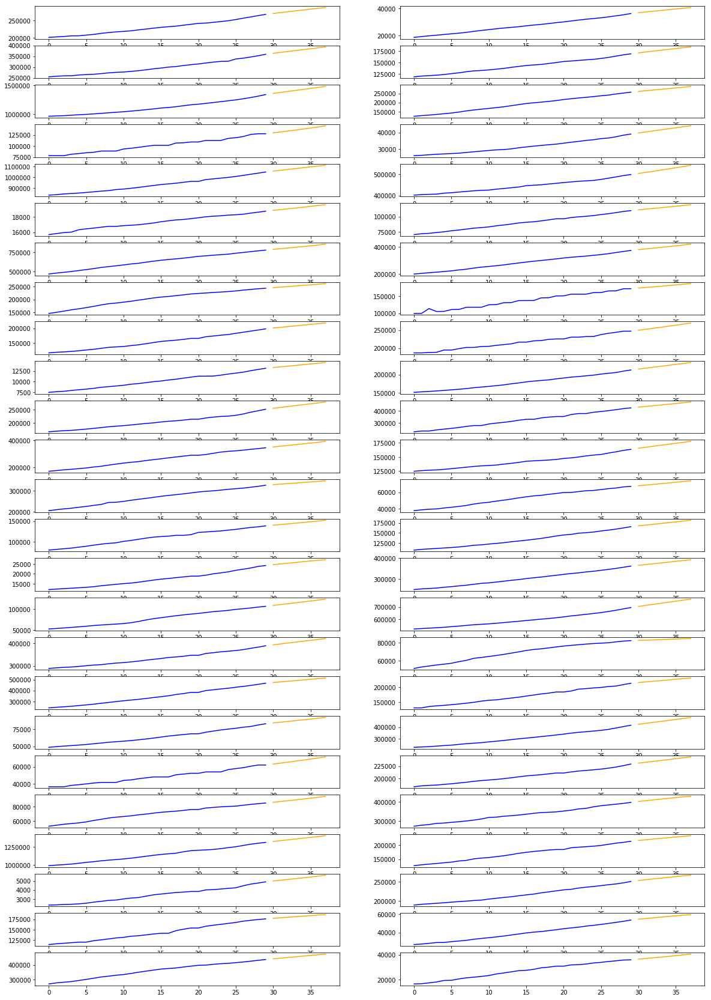

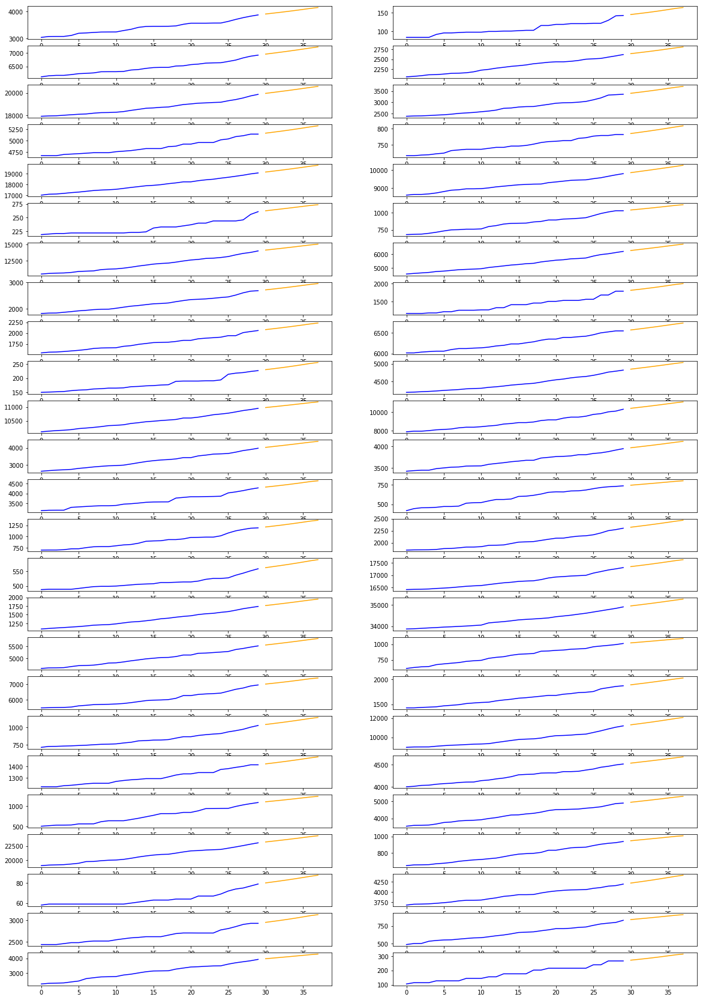

(3200, 56, 2)
(3200, 7, 50)
(3200, 7, 1)
(3200, 7, 1)
check
Epoch 00049: early stopping


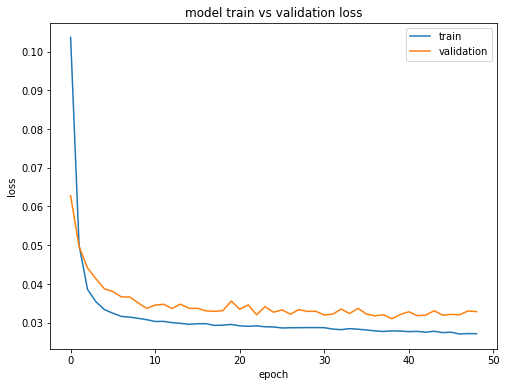

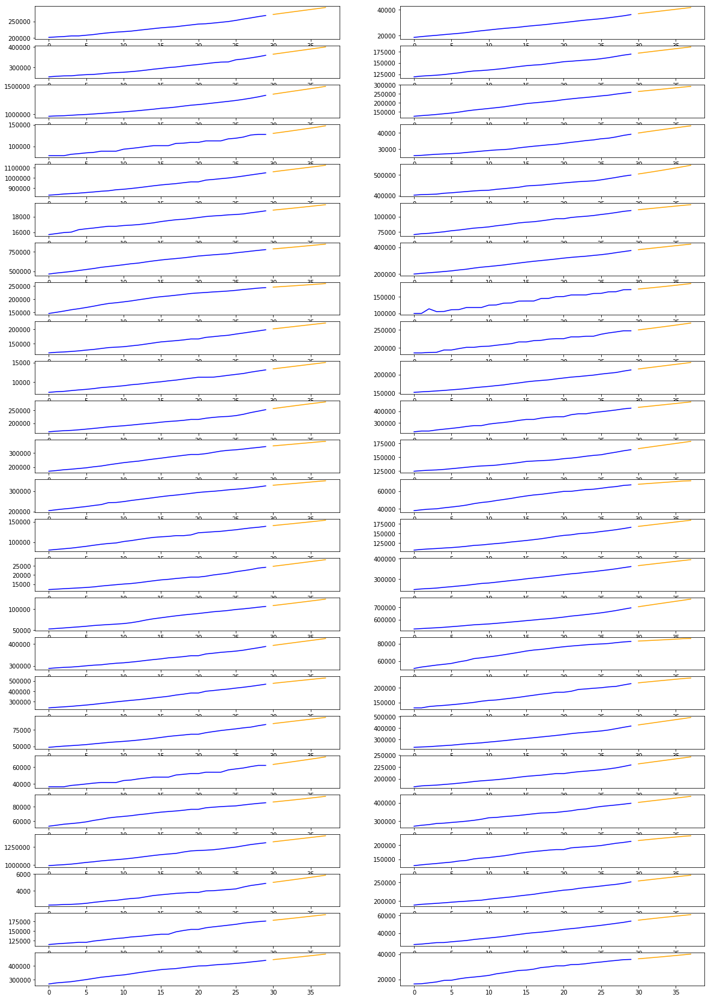

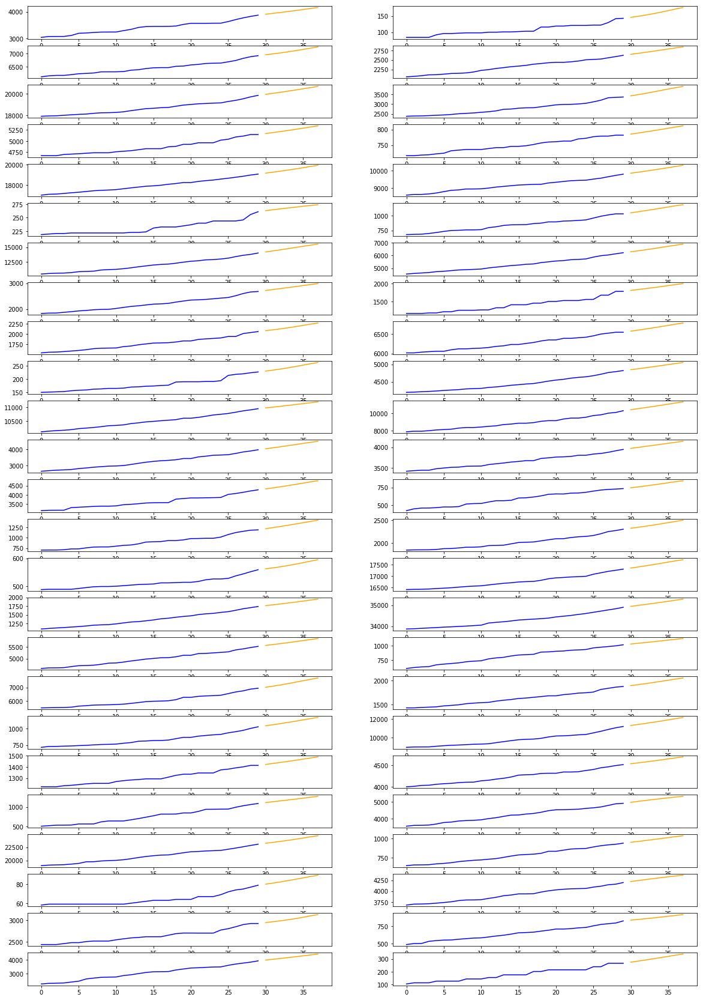

(4600, 56, 2)
(4600, 7, 50)
(4600, 7, 1)
(4600, 7, 1)
check
Epoch 00037: early stopping


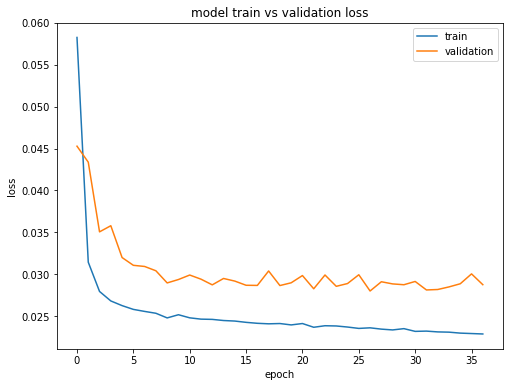

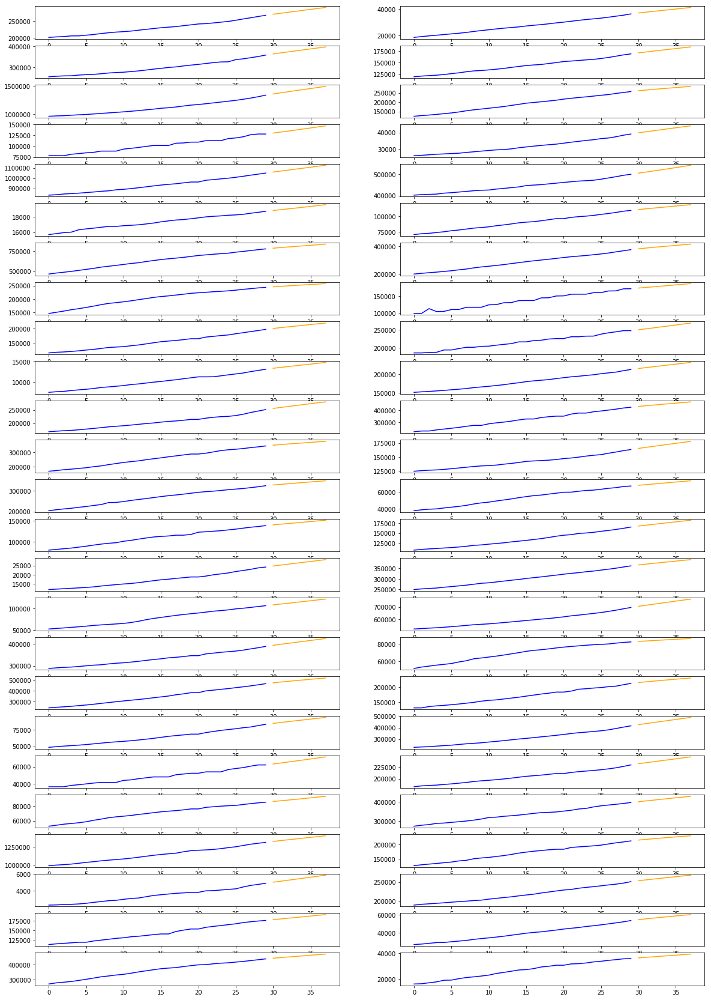

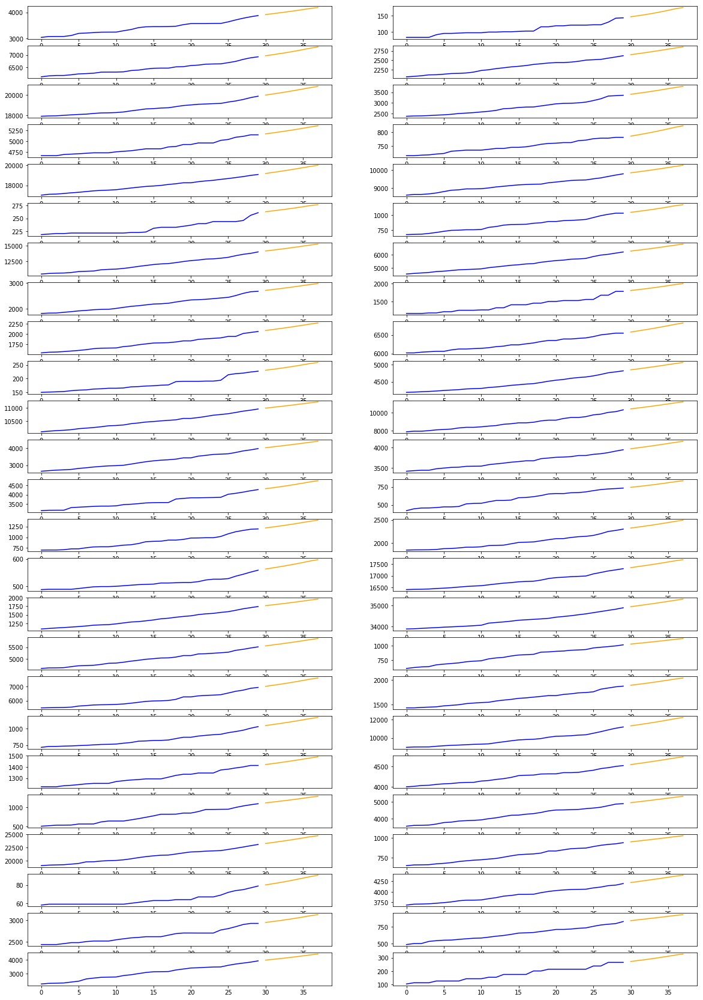

(6000, 56, 2)
(6000, 7, 50)
(6000, 7, 1)
(6000, 7, 1)
check
Epoch 00048: early stopping


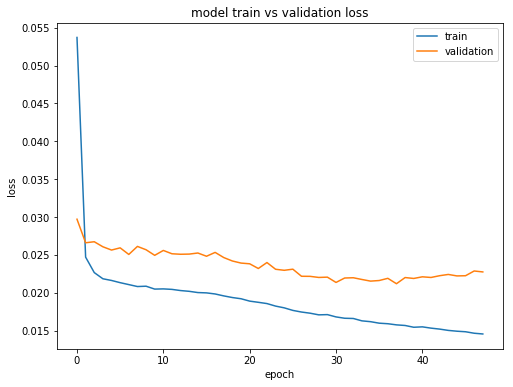

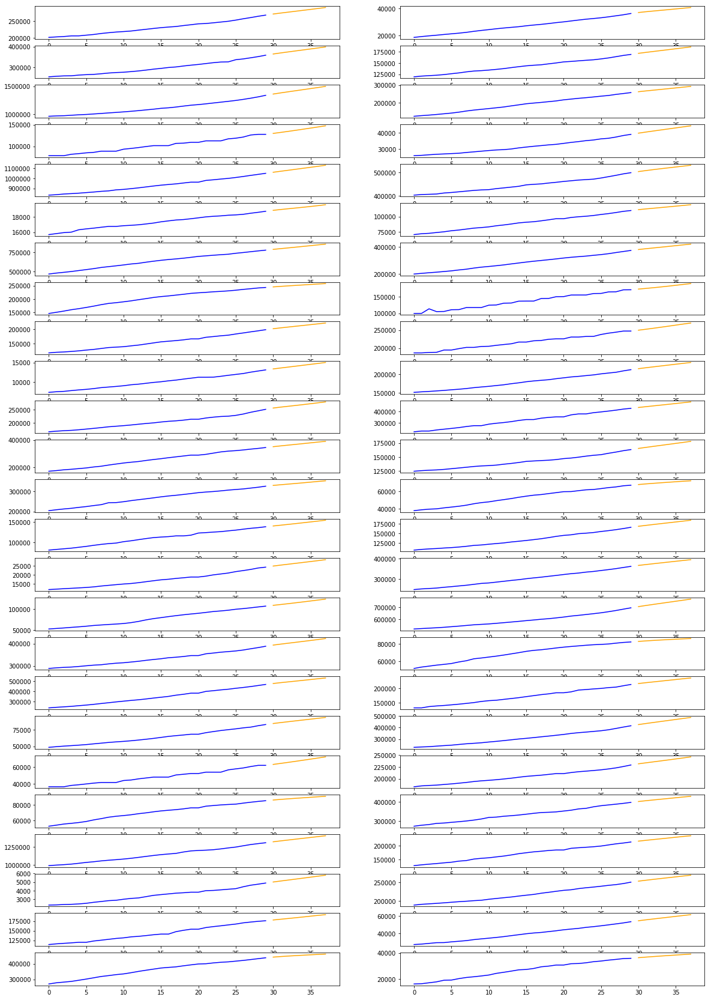

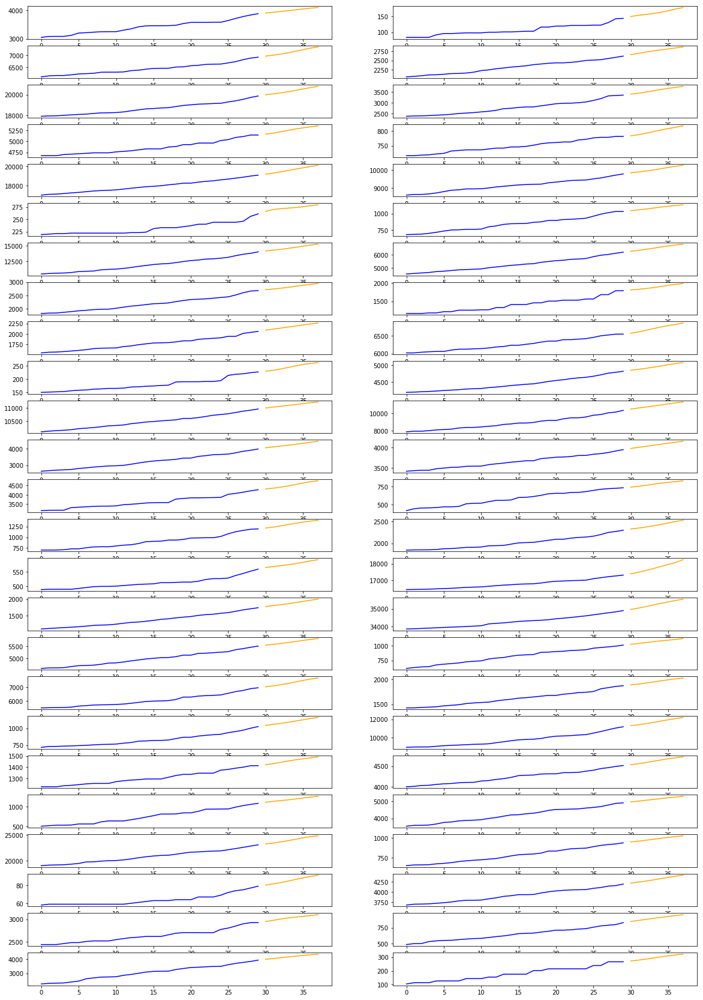

In [29]:
final_results_56 = []
for p_set in params_set_56:
    result = round2_go(p_set[0], p_set[1], p_set[2], p_set[3], p_set[4])
    final_results_56.append(result)





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.

(1450, 28, 2)
(1450, 7, 50)
(1450, 7, 1)
(1450, 7, 1)
check
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where

Epoch 00025: early stopping


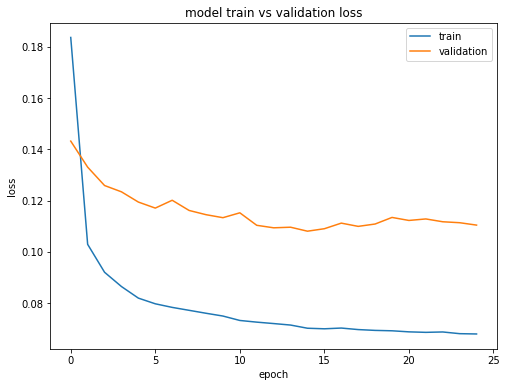

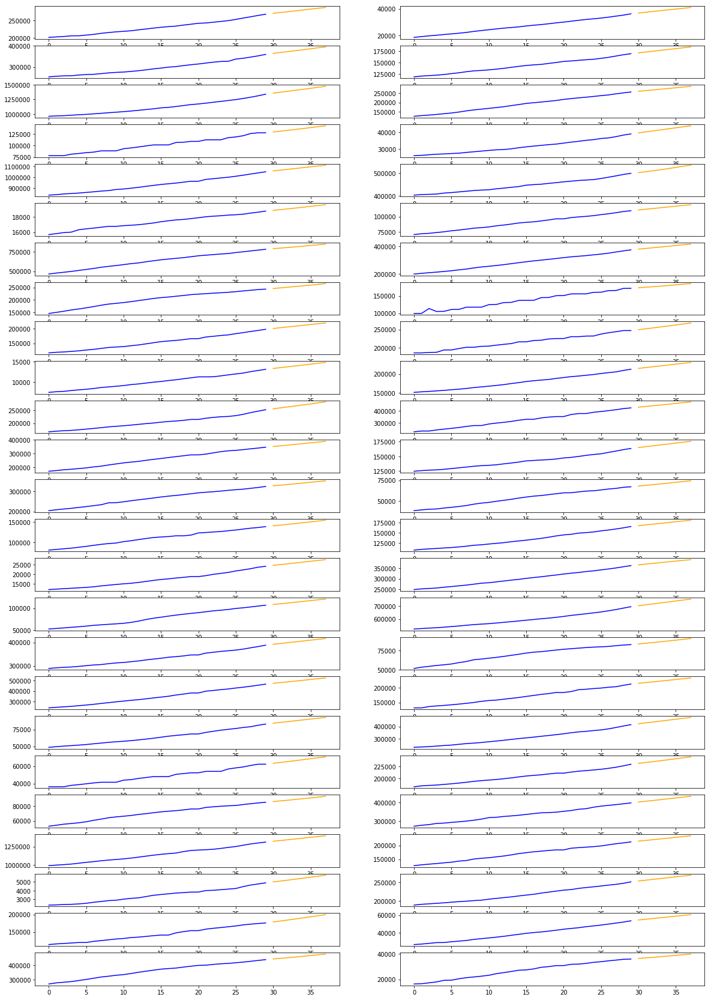

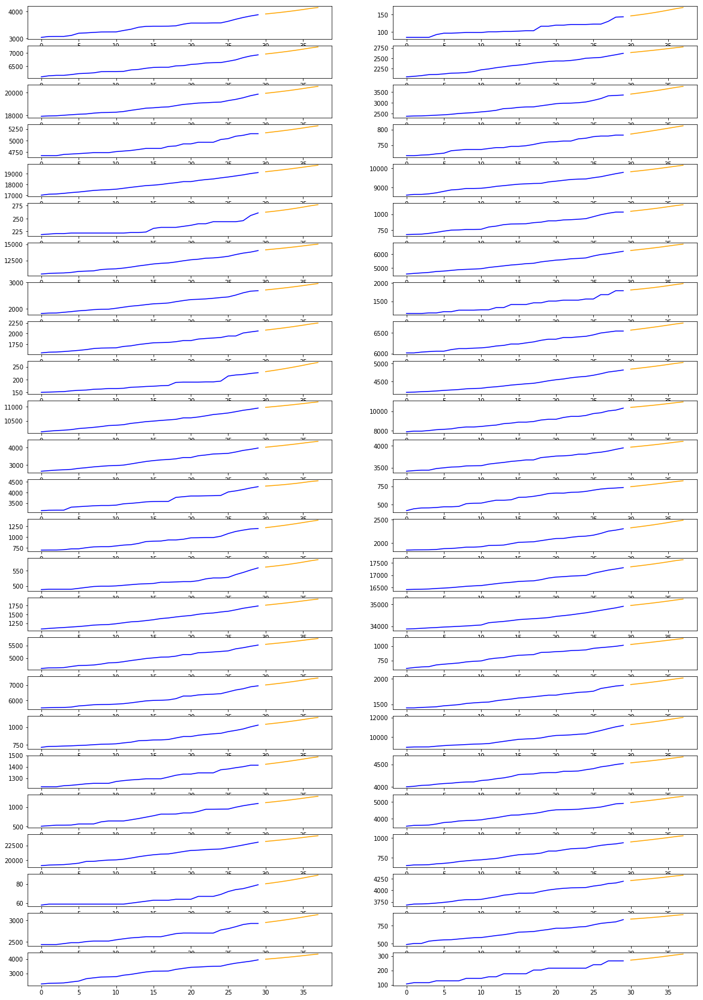

(1800, 28, 2)
(1800, 7, 50)
(1800, 7, 1)
(1800, 7, 1)
check
Epoch 00024: early stopping


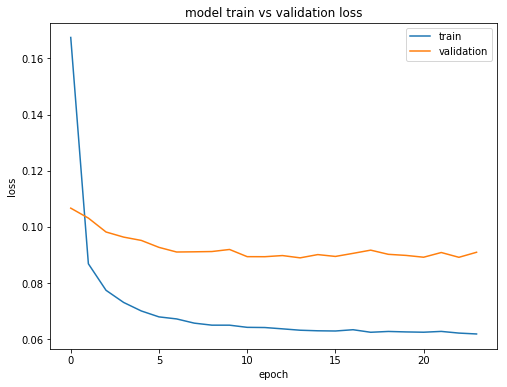

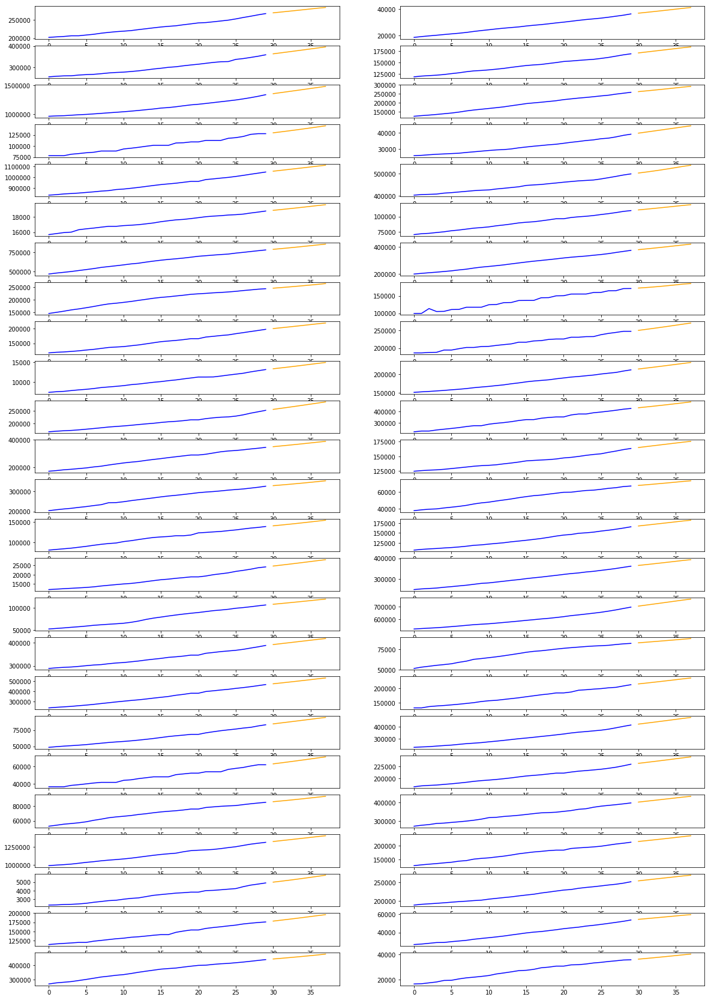

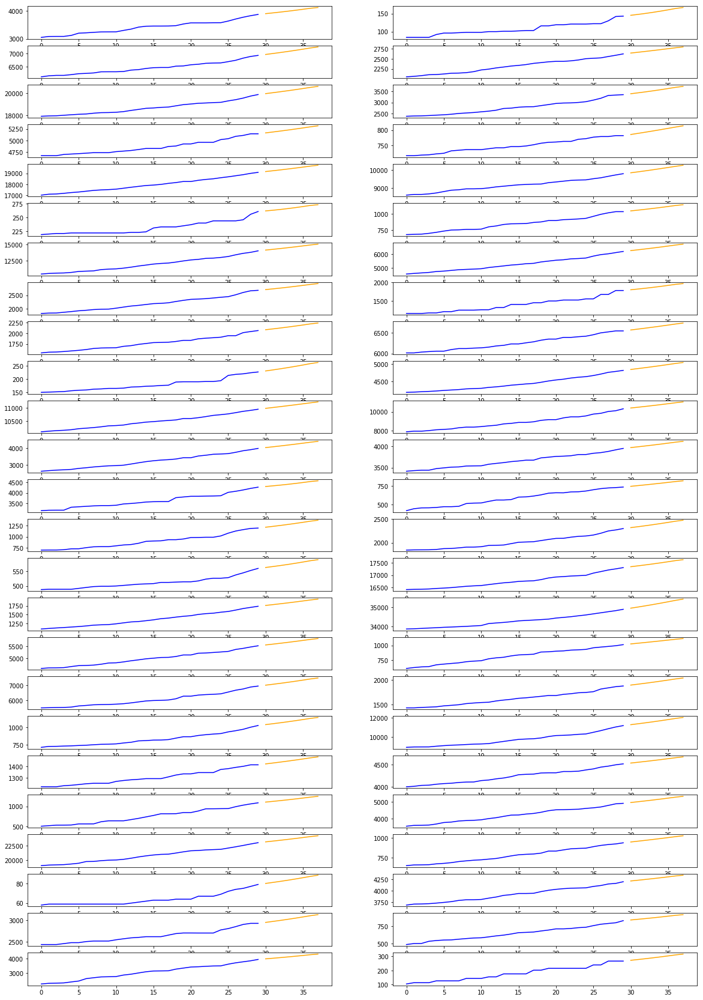

(3200, 28, 2)
(3200, 7, 50)
(3200, 7, 1)
(3200, 7, 1)
check
Epoch 00065: early stopping


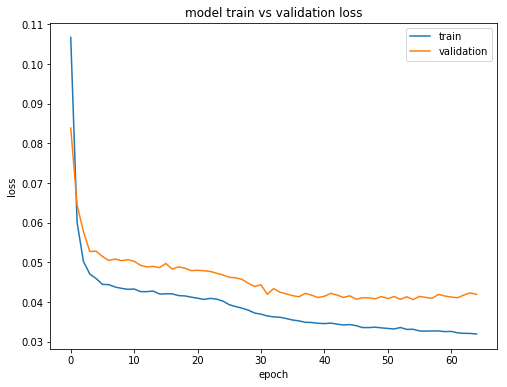

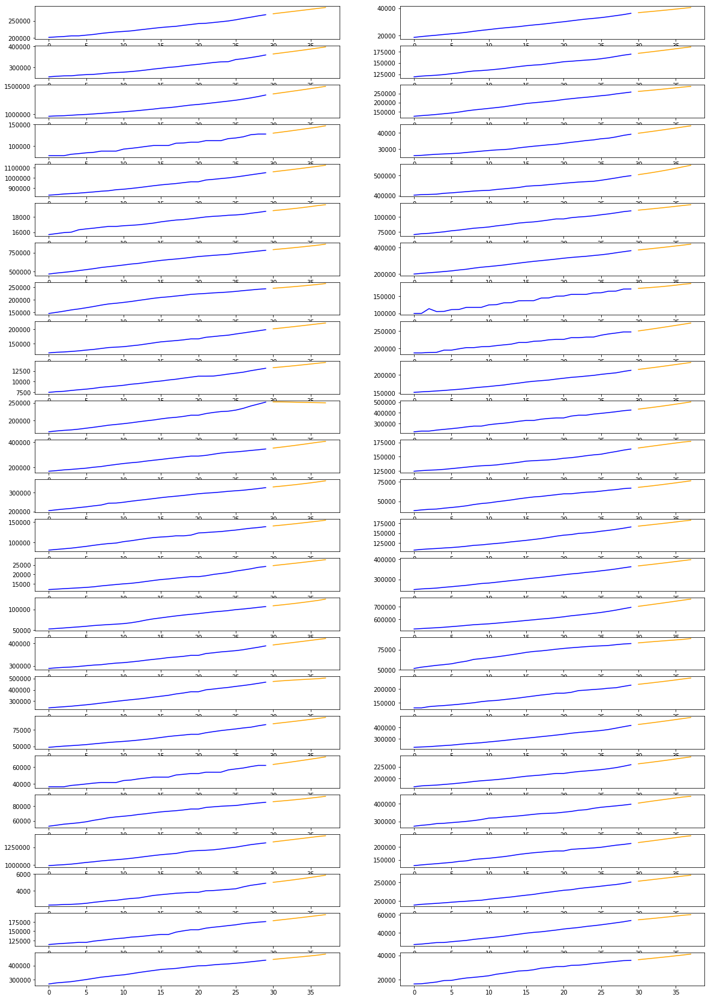

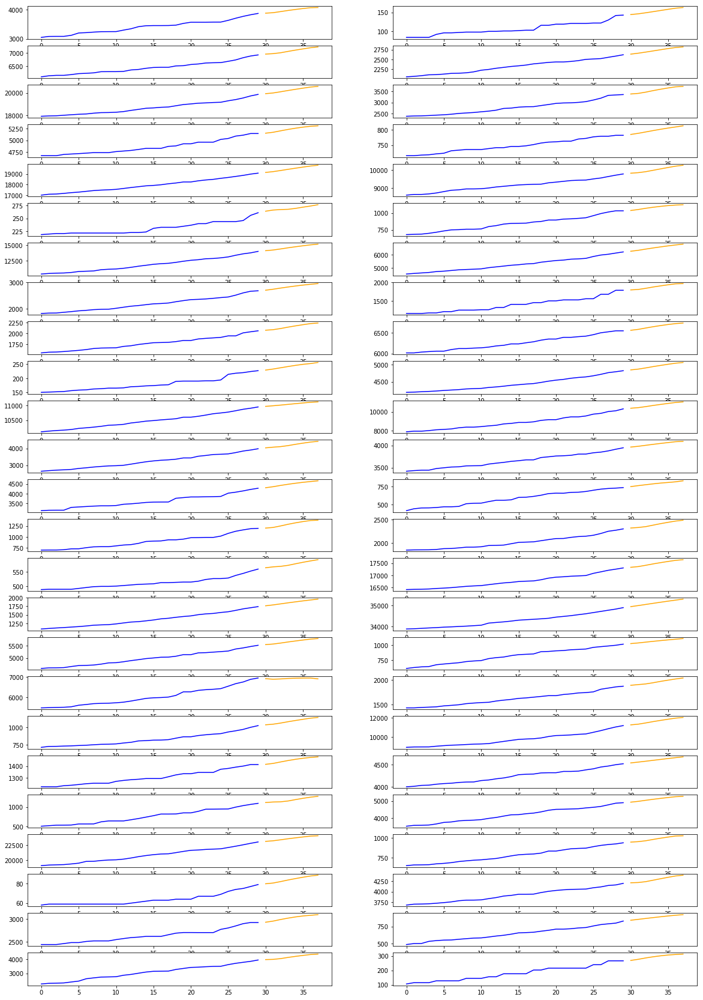

(4600, 28, 2)
(4600, 7, 50)
(4600, 7, 1)
(4600, 7, 1)
check
Epoch 00047: early stopping


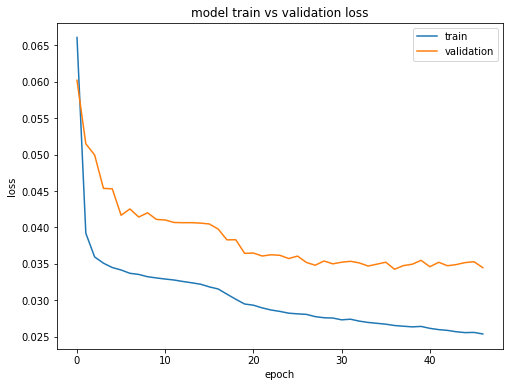

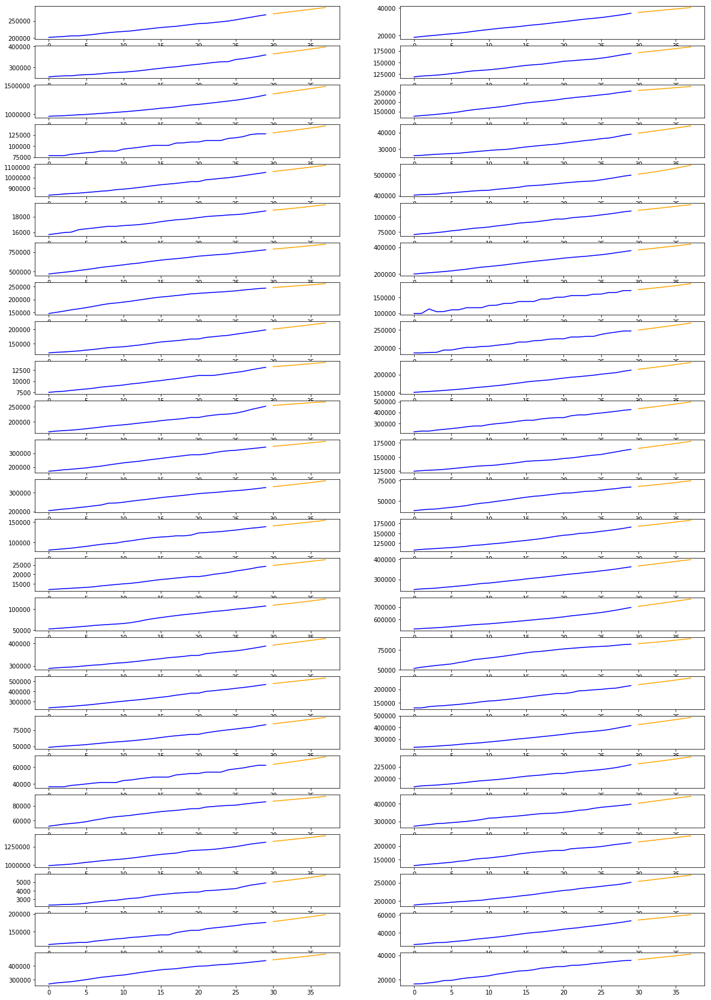

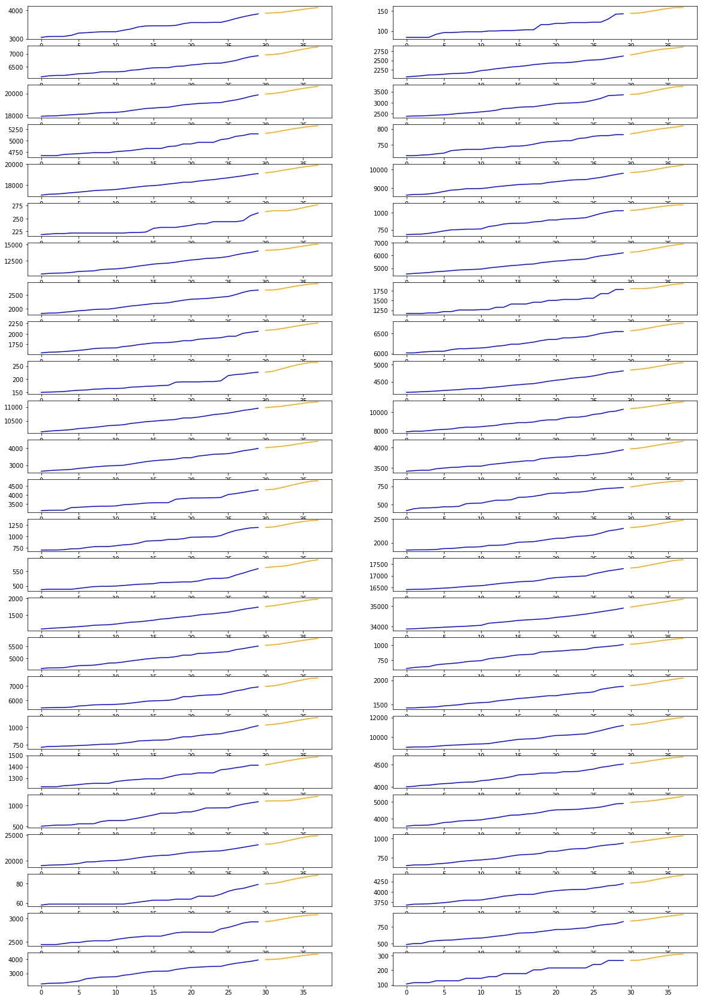

(1450, 28, 2)
(1450, 7, 50)
(1450, 7, 1)
(1450, 7, 1)
check
Epoch 00027: early stopping


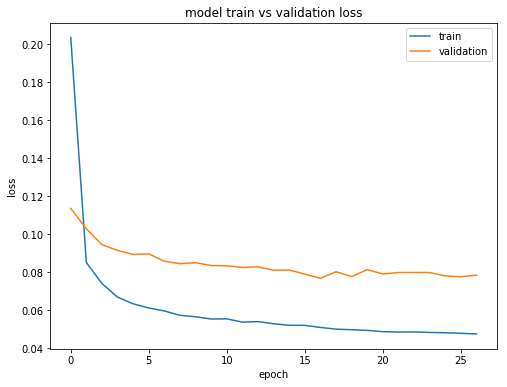

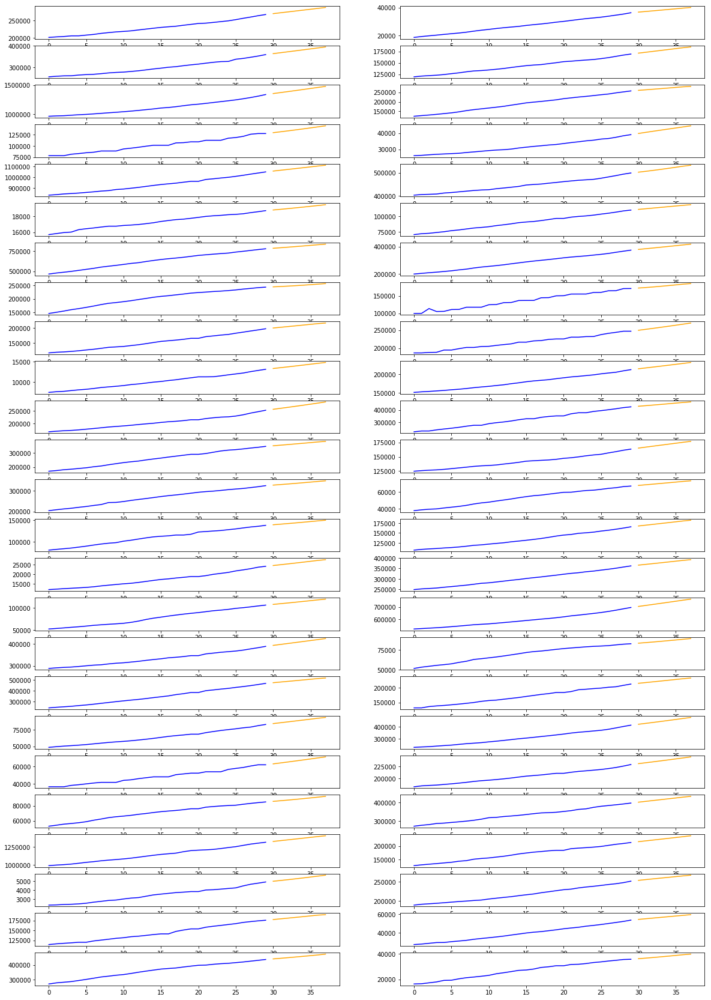

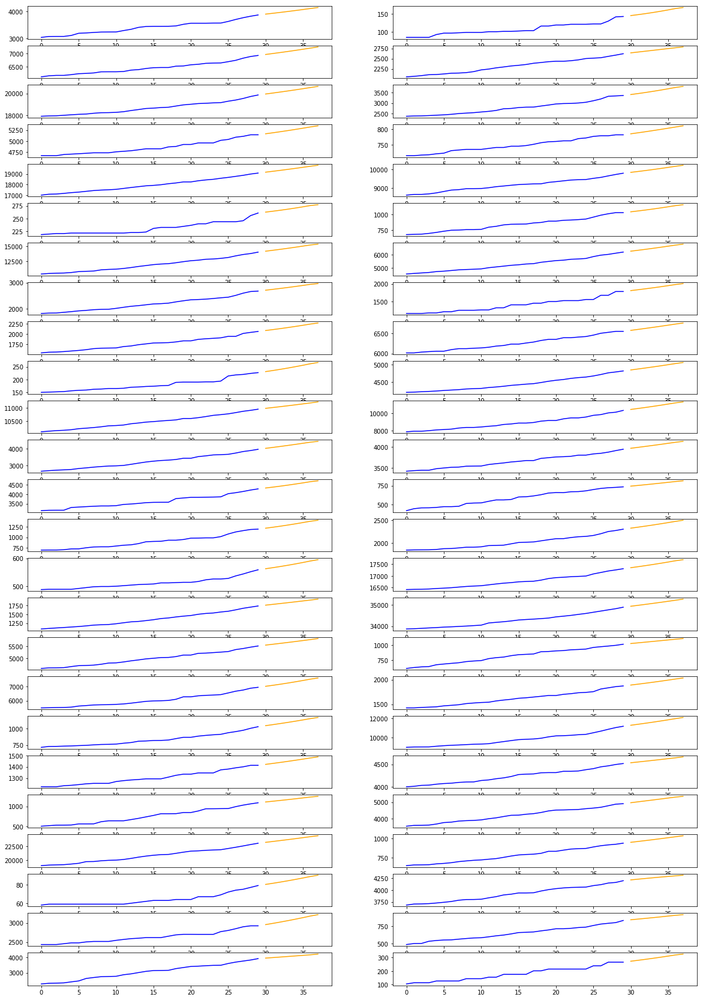

(1800, 28, 2)
(1800, 7, 50)
(1800, 7, 1)
(1800, 7, 1)
check
Epoch 00020: early stopping


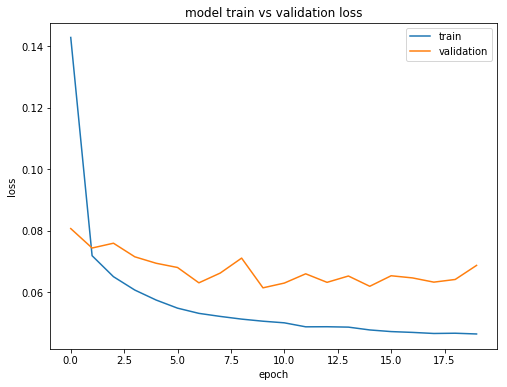

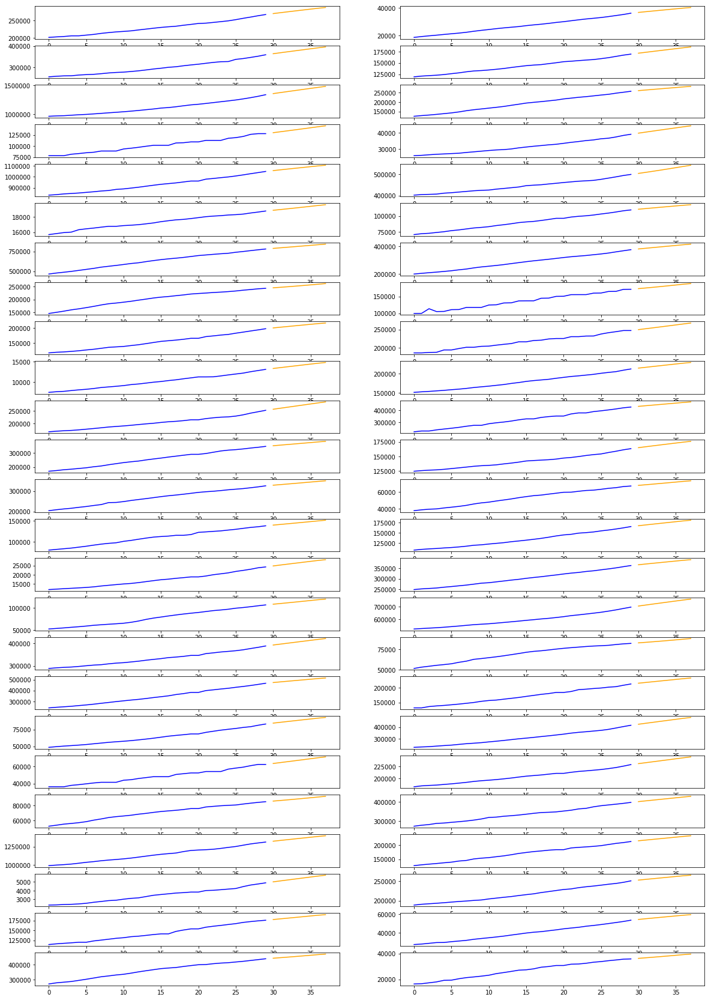

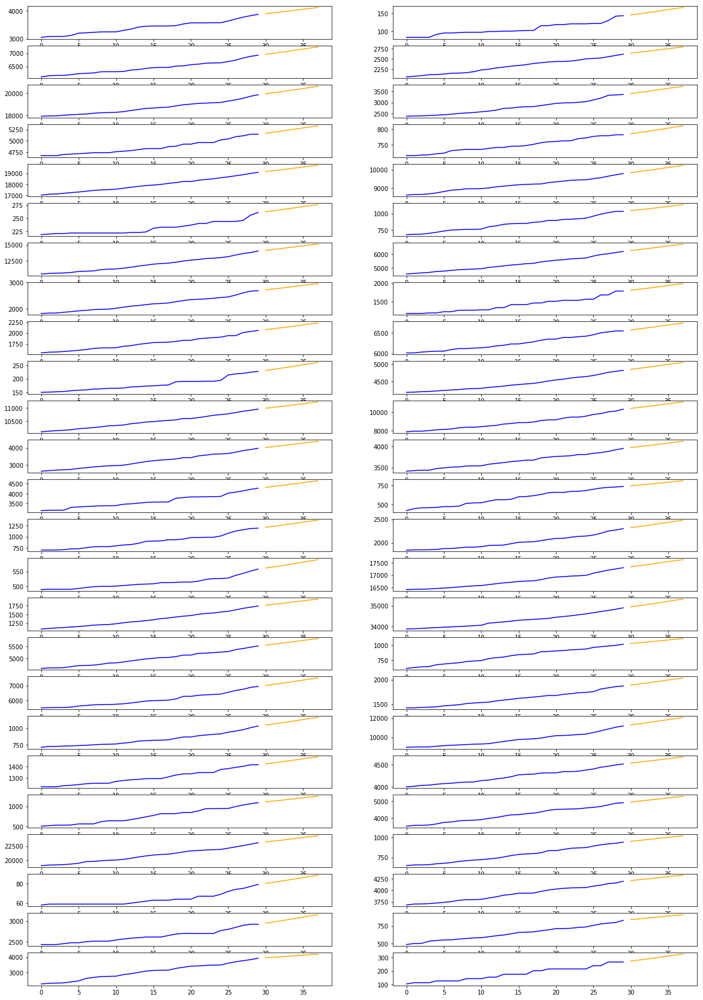

(3200, 28, 2)
(3200, 7, 50)
(3200, 7, 1)
(3200, 7, 1)
check
Epoch 00034: early stopping


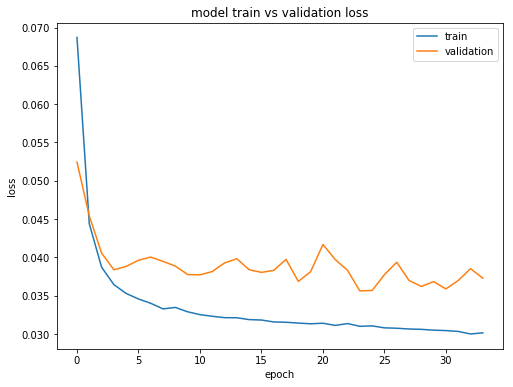

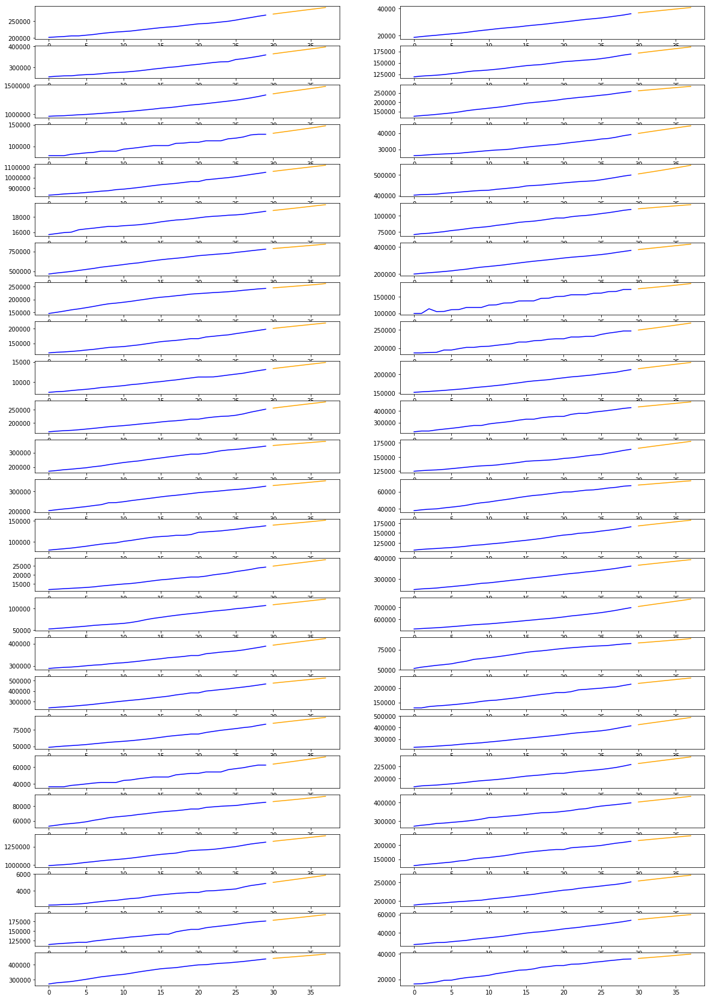

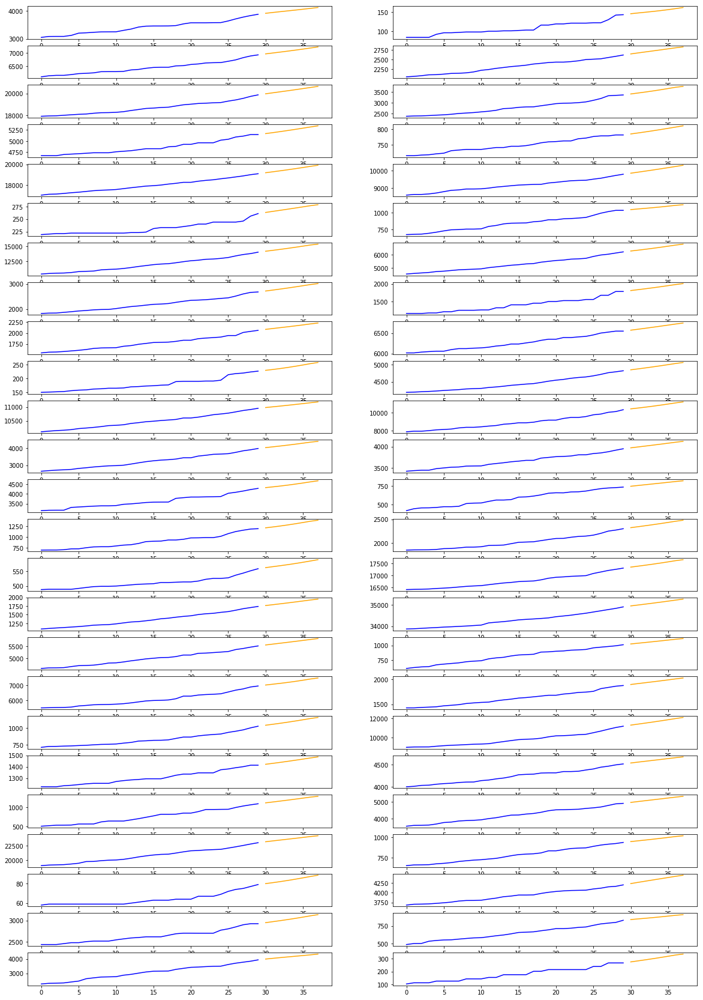

(4600, 28, 2)
(4600, 7, 50)
(4600, 7, 1)
(4600, 7, 1)
check
Epoch 00046: early stopping


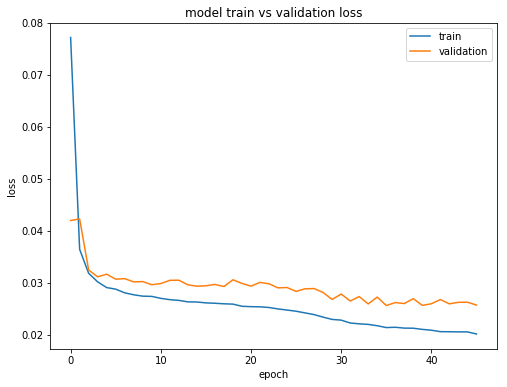

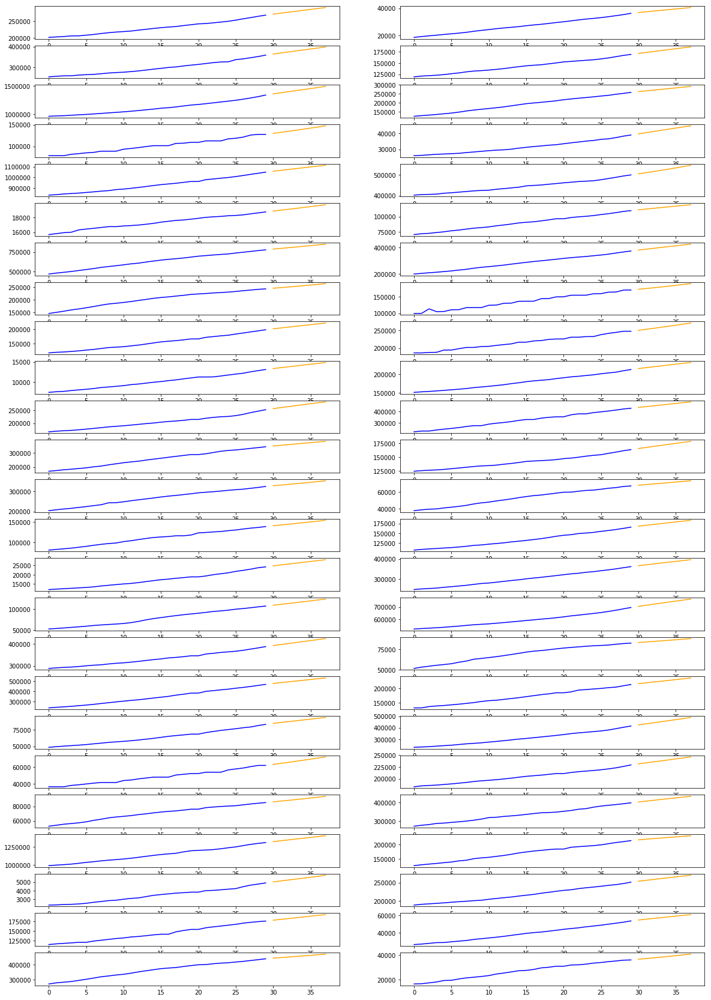

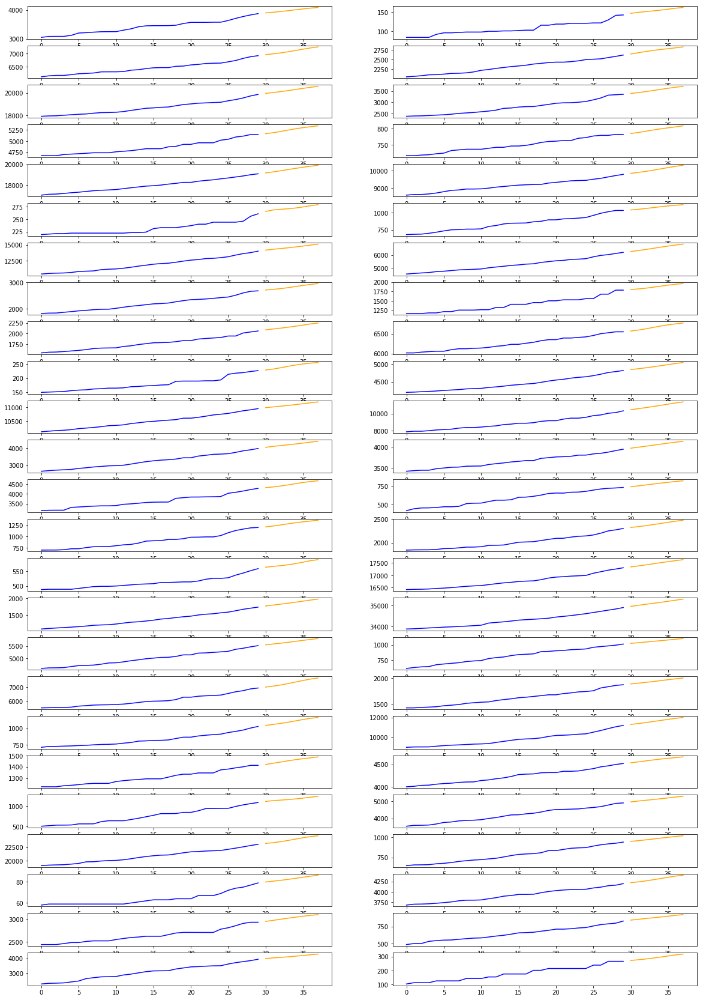

In [9]:
final_results_28 = []
for p_set in params_set_28:
    result = round2_go(p_set[0], p_set[1], p_set[2], p_set[3], p_set[4])
    final_results_28.append(result)

(2150, 14, 2)
(2150, 7, 50)
(2150, 7, 1)
(2150, 7, 1)
check
Epoch 00103: early stopping


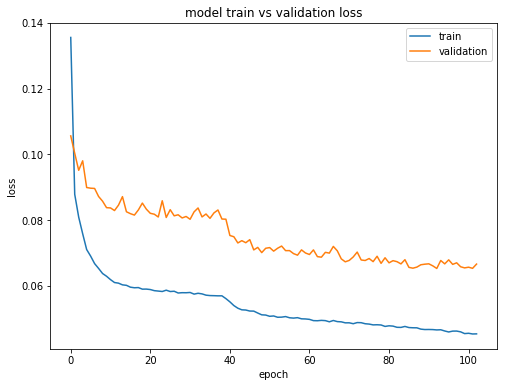

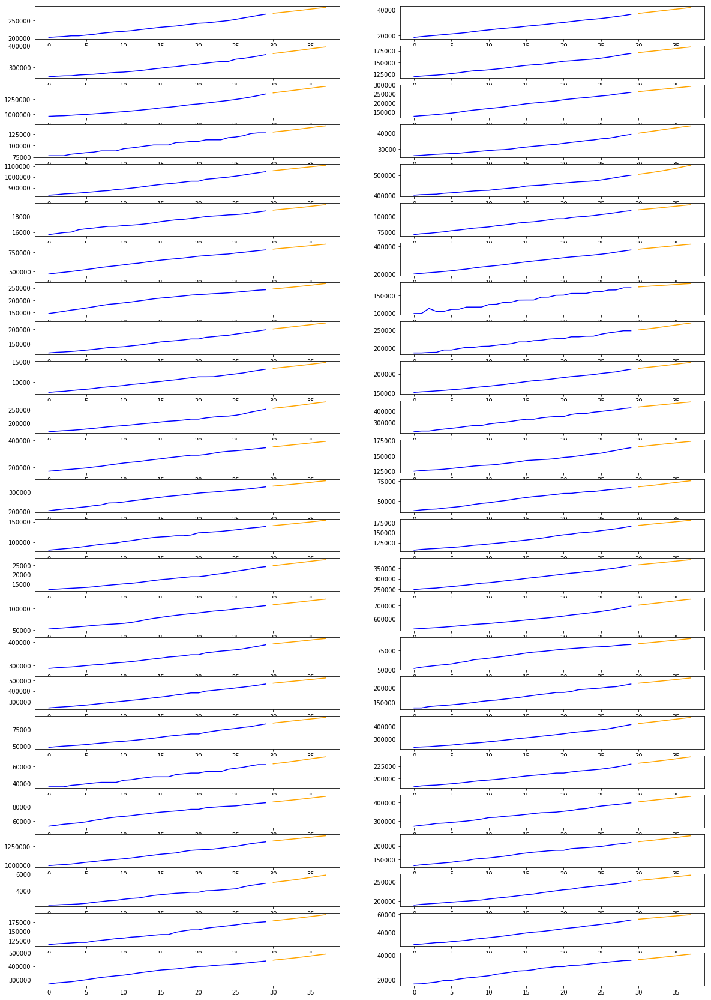

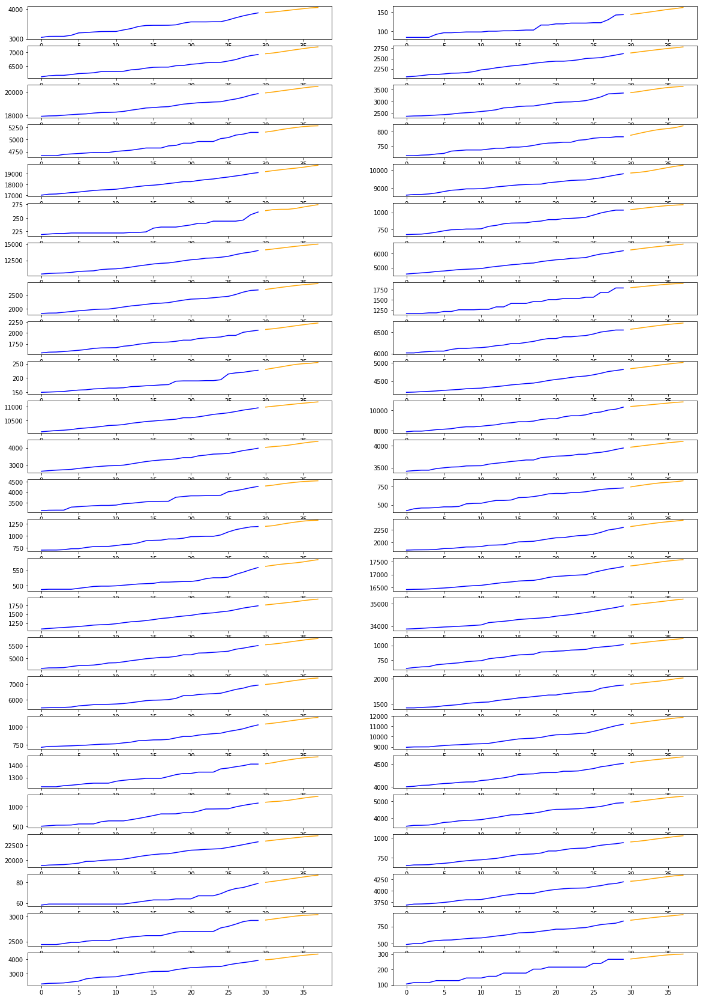

(2500, 14, 2)
(2500, 7, 50)
(2500, 7, 1)
(2500, 7, 1)
check
Epoch 00094: early stopping


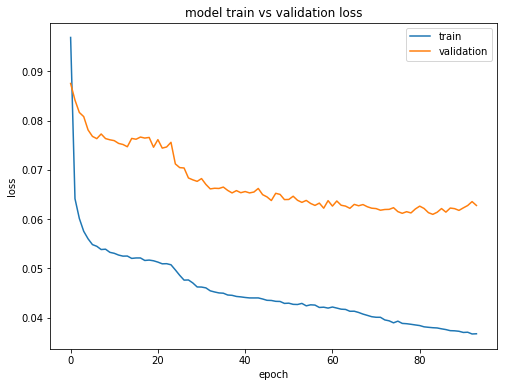

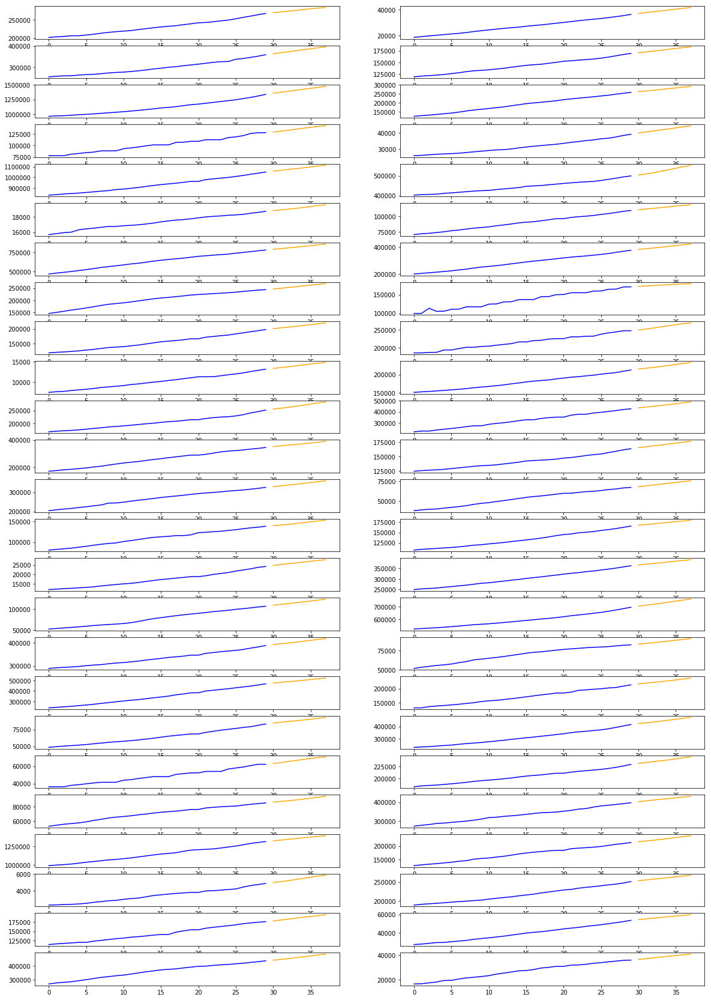

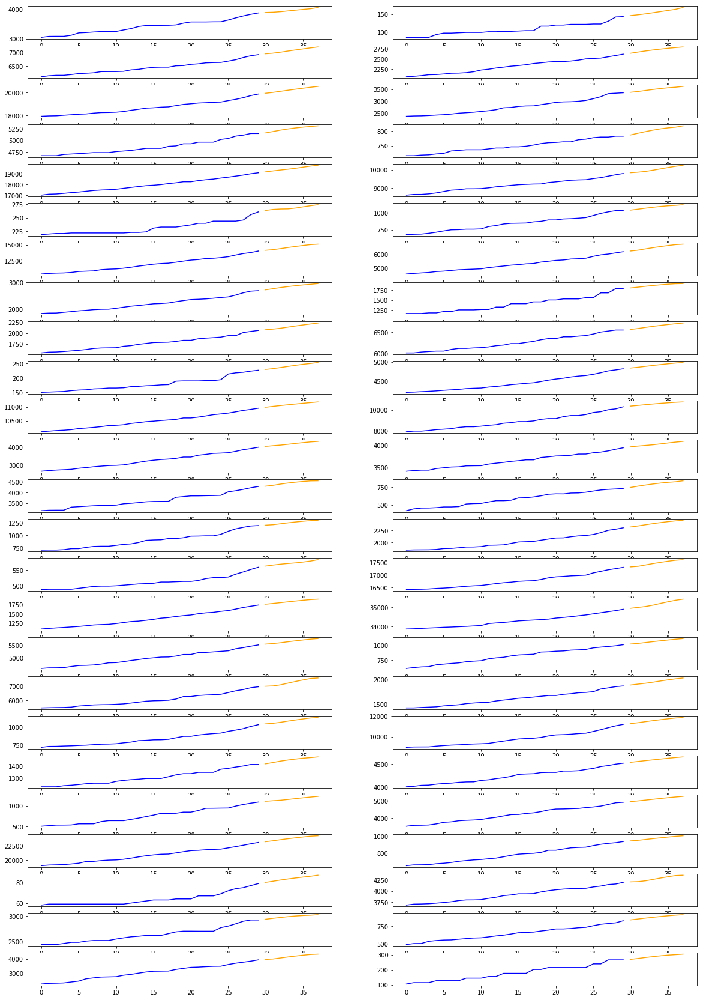

(3900, 14, 2)
(3900, 7, 50)
(3900, 7, 1)
(3900, 7, 1)
check
Epoch 00057: early stopping


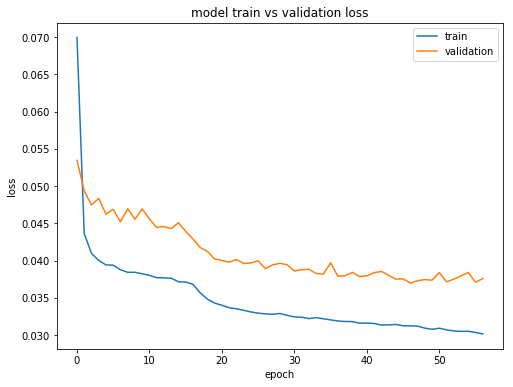

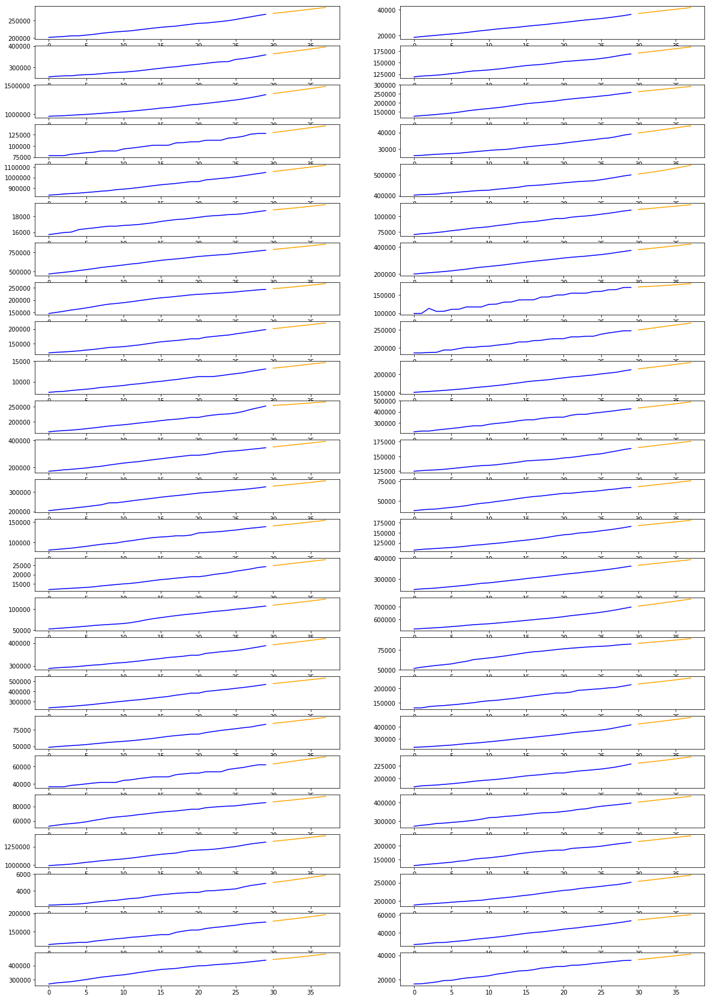

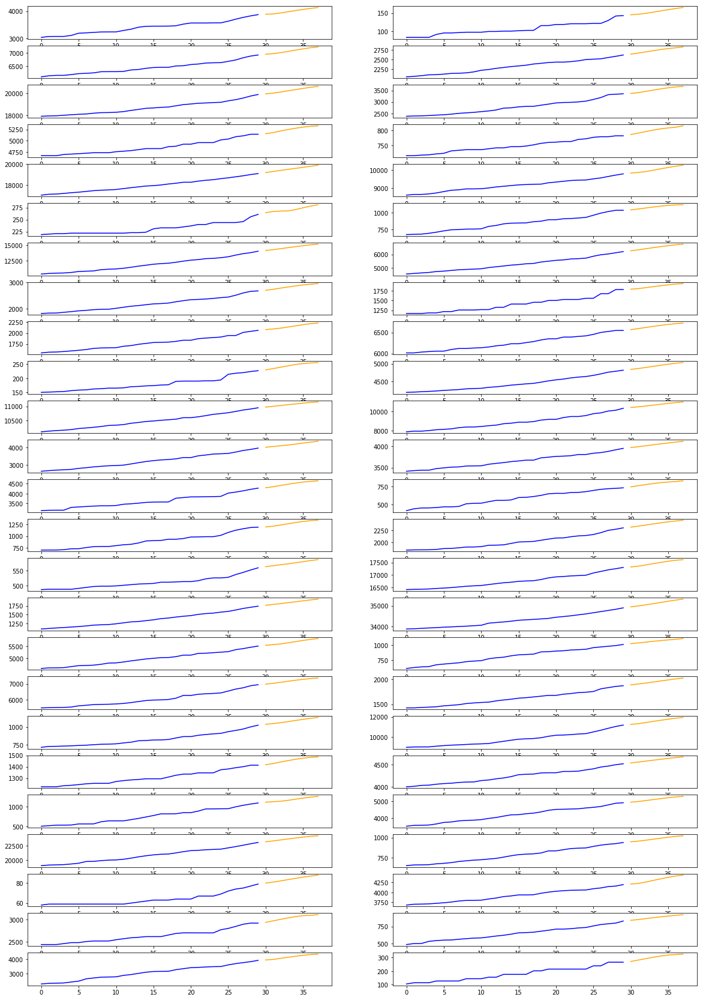

(5300, 14, 2)
(5300, 7, 50)
(5300, 7, 1)
(5300, 7, 1)
check
Epoch 00079: early stopping


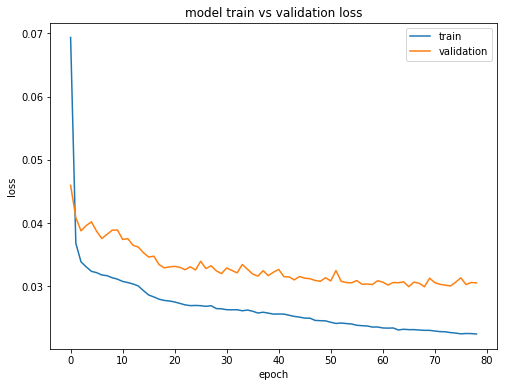

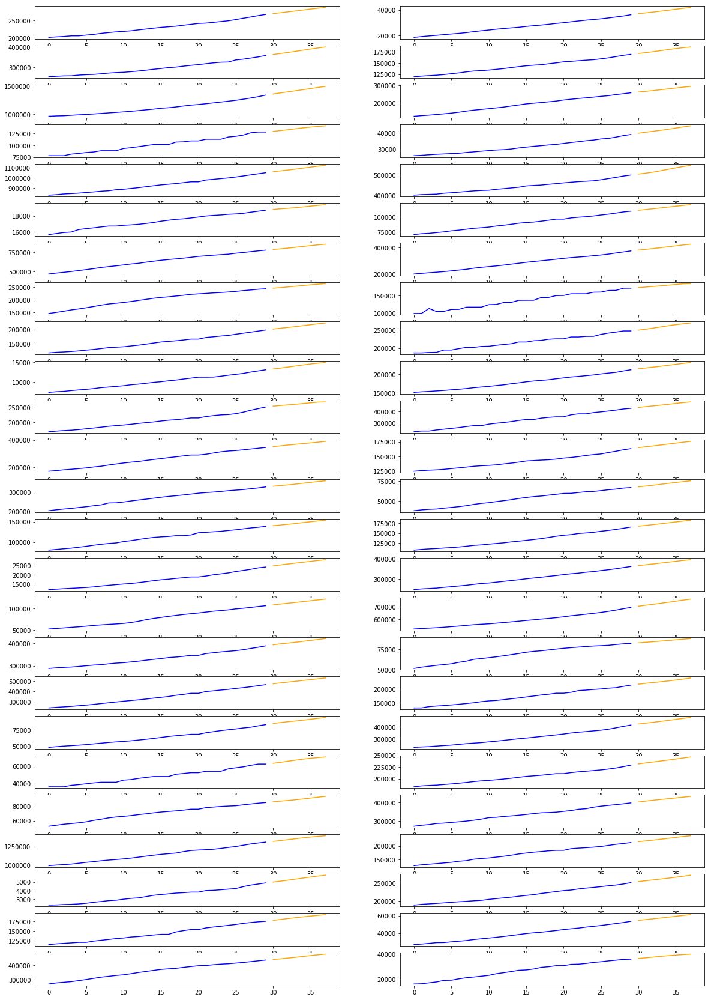

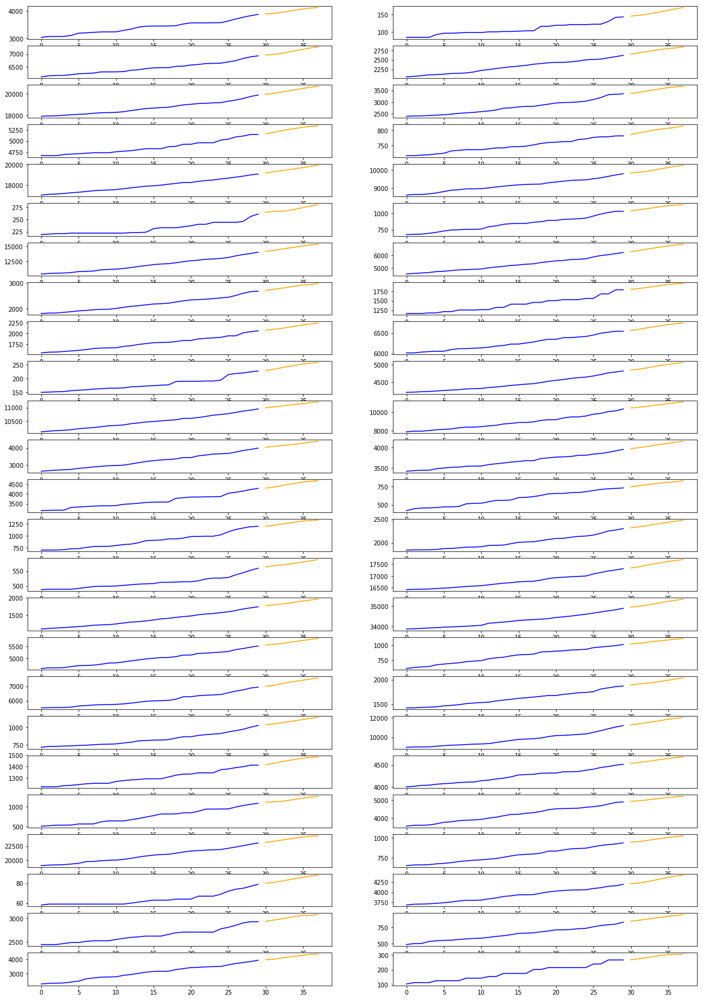

(2150, 14, 2)
(2150, 7, 50)
(2150, 7, 1)
(2150, 7, 1)
check
Epoch 00080: early stopping


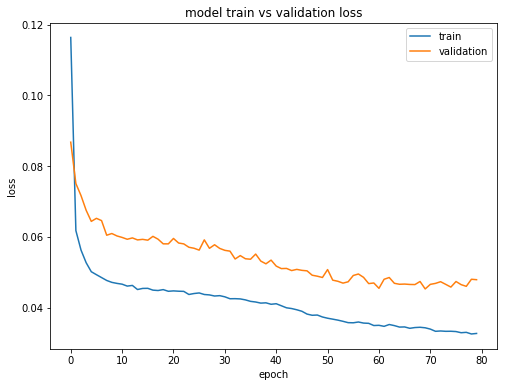

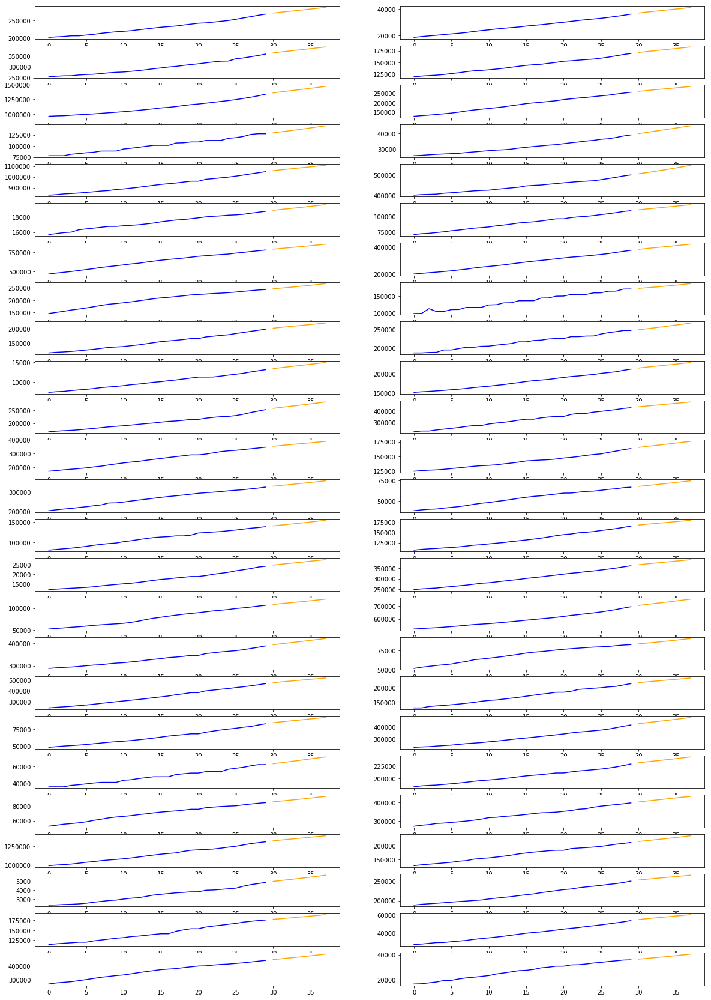

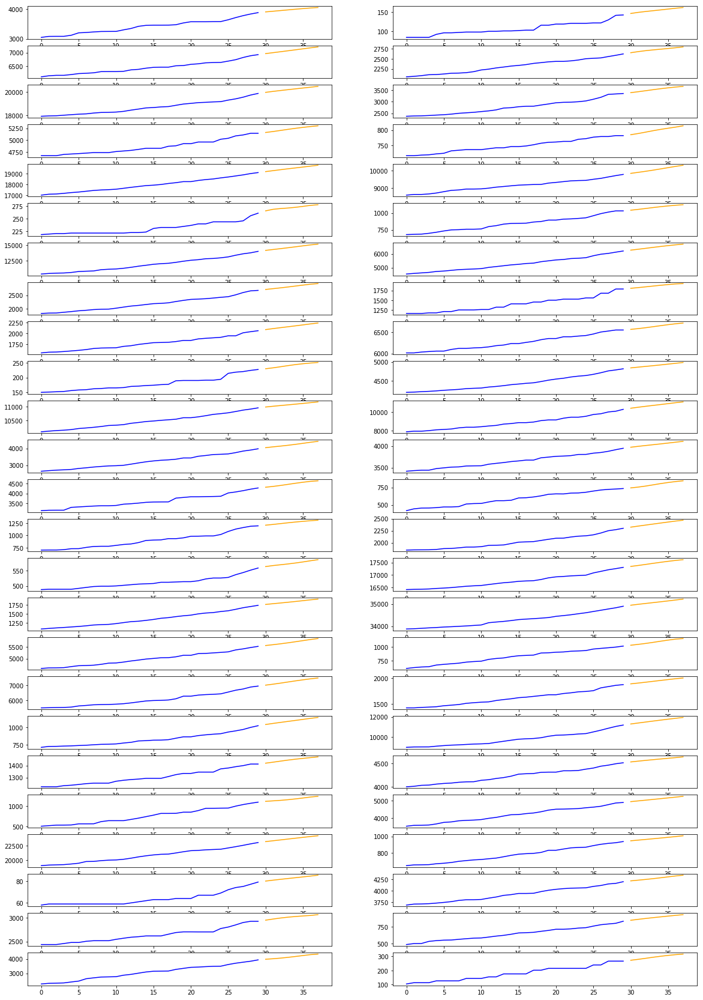

(2500, 14, 2)
(2500, 7, 50)
(2500, 7, 1)
(2500, 7, 1)
check
Epoch 00058: early stopping


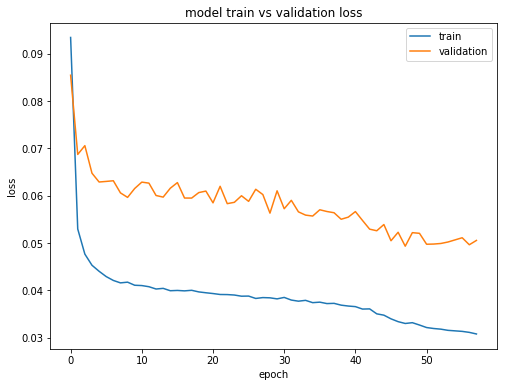

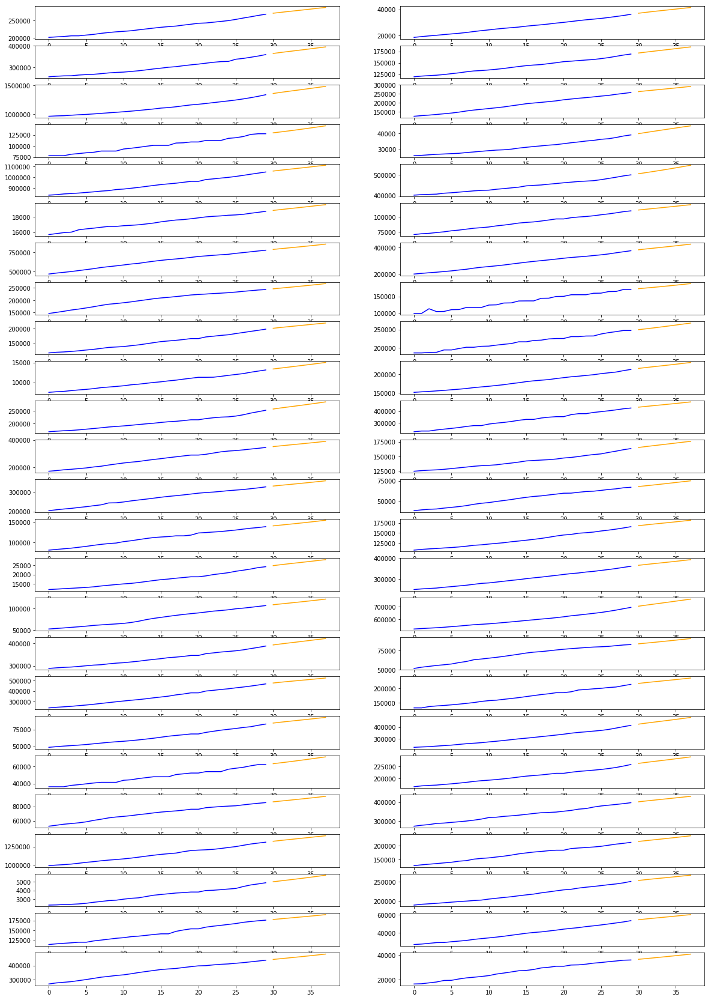

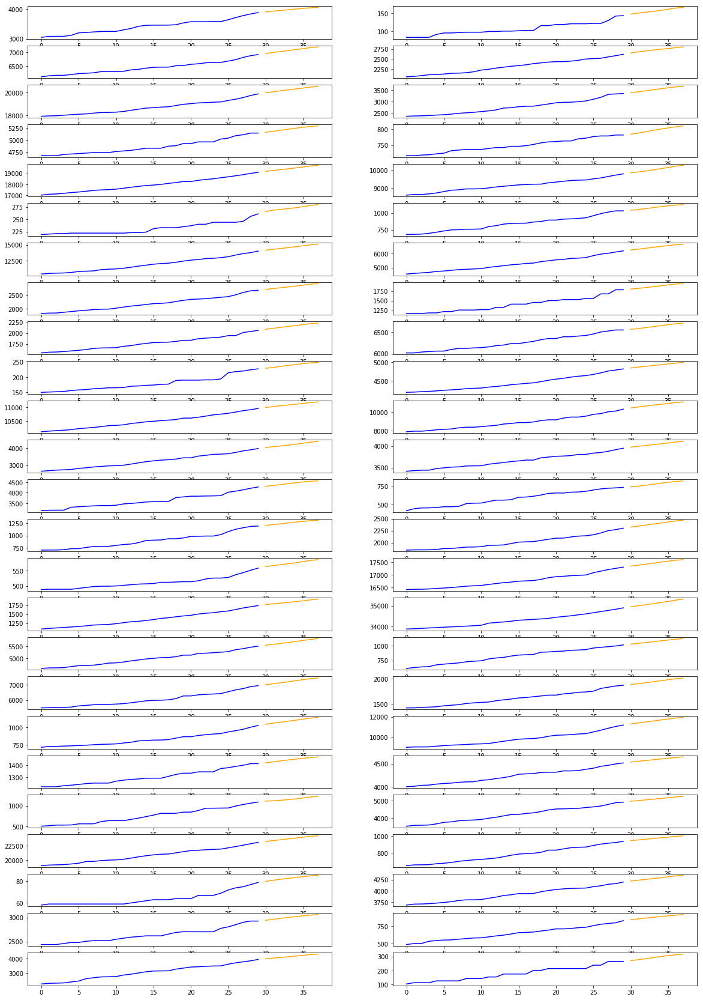

(3900, 14, 2)
(3900, 7, 50)
(3900, 7, 1)
(3900, 7, 1)
check
Epoch 00036: early stopping


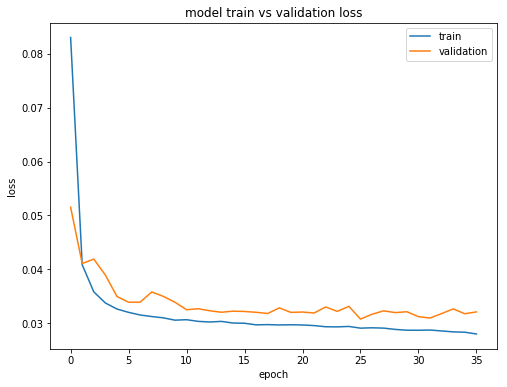

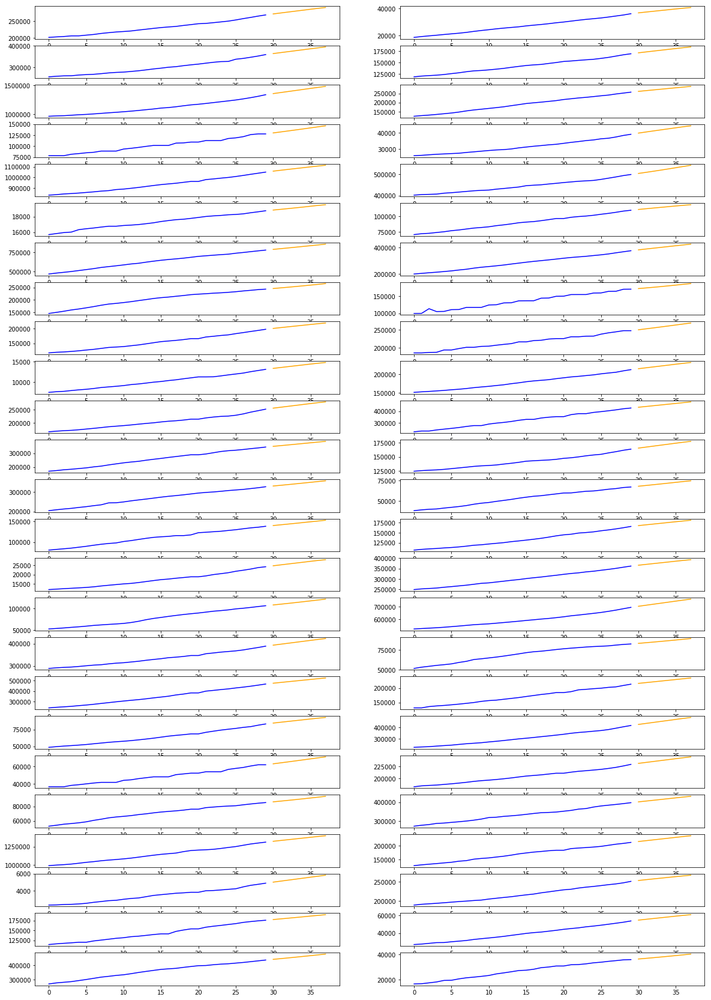

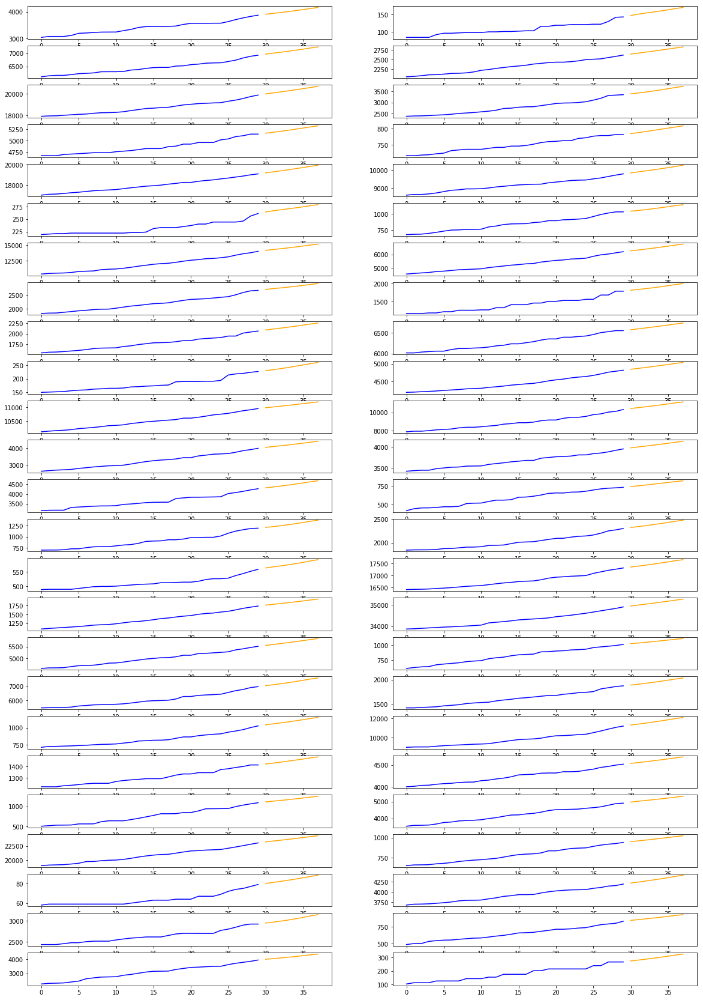

(5300, 14, 2)
(5300, 7, 50)
(5300, 7, 1)
(5300, 7, 1)
check
Epoch 00037: early stopping


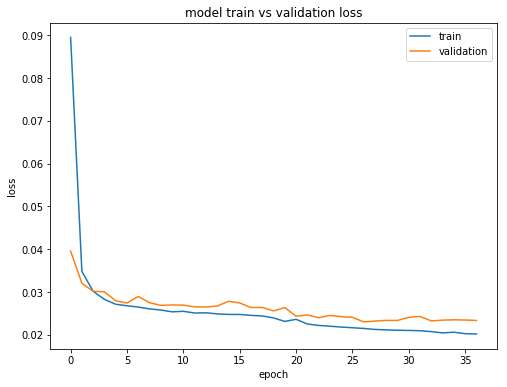

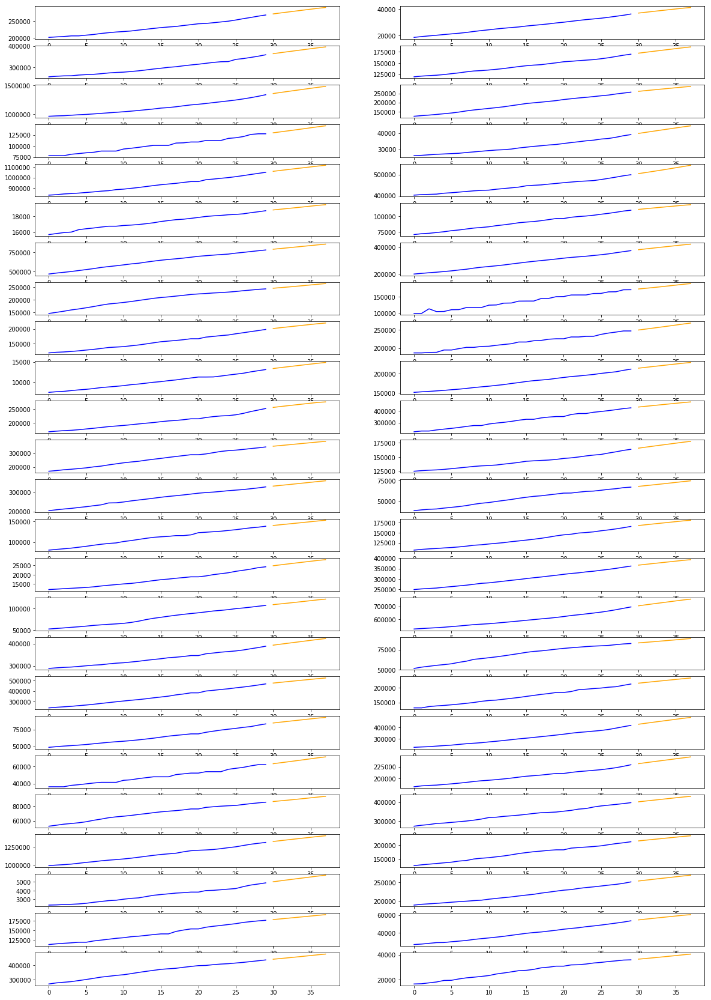

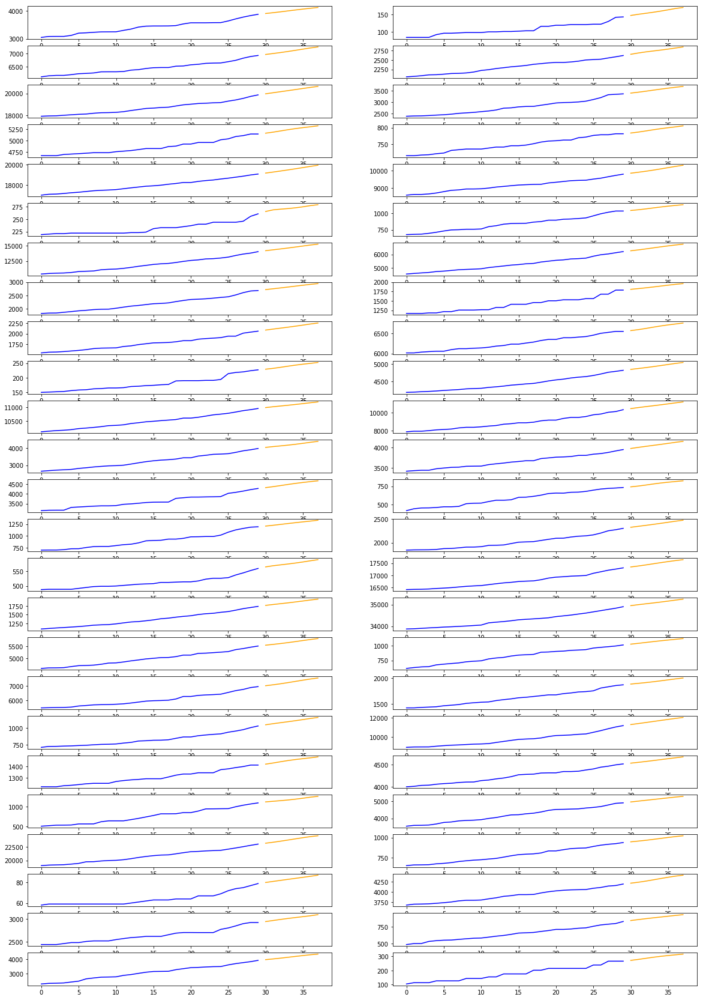

In [26]:
final_results_14 = []
for p_set in params_set_14:
    result = round2_go(p_set[0], p_set[1], p_set[2], p_set[3], p_set[4])
    final_results_14.append(result)

In [38]:
num_of_models = len(final_results_56) + len(final_results_28) + len(final_results_14)
num_of_models

28

In [43]:
final_results = final_results_56 + final_results_28 + final_results_14

In [46]:
final_confirmed = []
final_deaths = []
for i in range(50):
    sum_c = np.zeros(7)
    sum_d = np.zeros(7)
    for j in range(num_of_models):
        val_confirmed = np.array(final_results[j][0][i])
        val_deaths = np.array(final_results[j][1][i])
        sum_c += val_confirmed
        sum_d += val_deaths
    avg_c = sum_c / num_of_models
    avg_d = sum_d / num_of_models
    final_confirmed.append(avg_c.tolist())
    final_deaths.append(avg_d.tolist())

In [49]:
submission = pd.read_csv("submission_round2.csv")
submission.head()

for i in range(7):
    for j in range(50):
        submission.iloc[i*50+j, 1] = final_confirmed[j][i]
        submission.iloc[i*50+j, 2] = final_deaths[j][i]

In [50]:
submission

,ForecastID,Confirmed,Deaths
0,0,2.728775e+05,3926.867925
1,1,3.751126e+04,148.112129
2,2,3.684182e+05,6991.783165
3,3,1.732443e+05,2668.511019
4,4,1.374726e+06,20036.025427
...,...,...,...
345,345,2.688437e+05,4382.869588
346,346,1.936194e+05,3111.173564
347,347,6.019014e+04,921.261245
348,348,4.778930e+05,4346.967978


In [55]:
submission.to_csv('145_final_output_from_12-7', index = False)